# Table of Contents
1. **Descriptive Analysis**
   - Introduction to Taxi Data
   - Payment Method Trends
   - Idle Time of Taxis across the Day
     - Idle Time Analysis
     - Rush Hour Impact on Idle Time
     - Idle Time by Company (TODO)

2. **Spatial Analytics**
   - Geographic Distribution of Taxi Activity
   - Pickup vs. Dropoff Behavior
   - Taxi Companies' Spatial Coverage
   - Choropleth Map Analysis
     - Length, Duration, and Speed
     - Total Fare, Tips, and Extras
     - Idle Time Distribution

3. **Spatial-Temporal Analytics**
   - Trip Count Over the Day
     - Weekday vs. Weekend Patterns
   - Distance and Duration Over Time
   - Speed Variation Across the Day
   - Average Total Fare Over Time
   - Fare per Minute and Kilometer Analysis
   - Idle Time Over the Course of the Day
   - COVID-19 Impact Assessment

4. **Conclusions**


# Environment Setup and Imports

In [2]:
# Install the necessary packages
!pip install pandas numpy shapely geopandas h3 matplotlib seaborn

In [3]:
import pandas as pd
import numpy as np
from shapely.geometry import Polygon
import geopandas as gpd
import h3
from h3 import h3
from shapely.ops import unary_union
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.patheffects as path_effects
from shapely import wkt
import seaborn as sns
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from shapely.affinity import scale
from matplotlib.patches import RegularPolygon

# Create Dataset with h3 indexes

In [4]:
def add_h3_indexes(df, lat_col, lon_col, resolutions, name):
    for resolution in resolutions:
        h3_col_name = f'h3_res_{resolution}_{name}'
        df[h3_col_name] = df.apply(lambda row: h3.geo_to_h3(row[lat_col], row[lon_col], resolution), axis=1)

In [5]:
df = pd.read_csv("../Datasets/taxi_trips_with_weather_cleaned.csv")

In [6]:
# Assuming df is your DataFrame
column_names = df.columns.tolist()
print(column_names)

['trip_id', 'taxi_id', 'timestamp_start', 'timestamp_end', 'duration', 'distance', 'fare', 'tips', 'tolls', 'extras', 'total', 'payment_type', 'company', 'pickup_lat', 'pickup_long', 'pickup_location', 'dropoff_lat', 'dropoff_long', 'dropoff_location', 'temperature', 'dew_point', 'humidity', 'wind_speed', 'wind_gust', 'pressure', 'precipitation_rate', 'precipitation_accumulation']


In [7]:
df = df[['trip_id', 'taxi_id', 'timestamp_start', 'timestamp_end', 'duration', 'distance', 'fare', 'tips', 'tolls', 'extras', 'total', 'payment_type', 'company', 'pickup_lat', 'pickup_long', 'pickup_location', 'dropoff_lat', 'dropoff_long', 'dropoff_location']]

In [8]:
# Transforms the string into a shapely geometry object
df['pickup_location'] = df['pickup_location'].apply(wkt.loads)
df['dropoff_location'] = df['dropoff_location'].apply(wkt.loads)

gdf = gpd.GeoDataFrame(df, geometry='pickup_location', crs="EPSG:4326")
gdf.set_geometry('dropoff_location', inplace=True, crs="EPSG:4326")

In [9]:
add_h3_indexes(gdf, "pickup_lat", "pickup_long", [6,7,8,9], "start")
add_h3_indexes(gdf, "dropoff_lat", "dropoff_long", [6,7,8,9], "end")

In [10]:
gdf.to_pickle("../Datasets/taxi_trips_with_h3_indexes.pkl")

# Descriptive Analytics

In [11]:
df.head()

,trip_id,taxi_id,timestamp_start,timestamp_end,duration,distance,fare,tips,tolls,extras,total,payment_type,company,pickup_lat,pickup_long,pickup_location,dropoff_lat,dropoff_long,dropoff_location
0,0cd46aa628ea5f871630113eb8ba92e4,09a6eaba341c43fc653756deff43a50f,2020-01-01 00:00:00,2020-01-01 00:15:00,180.0,0.64,4.50,0.00,0.0,1.0,5.50,Cash,"Taxicab Insurance Agency, LLC",41.898332,-87.620763,POINT (-87.6207628651 41.8983317935),41.899156,-87.626211,POINT (-87.6262105324 41.8991556134)
1,4fbe84436a116f11c51ef3306e7adf0c,0f66b306ebea0f05dd124bf958729b64,2020-01-01 00:00:00,2020-01-01 00:30:00,1723.0,1.13,12.00,0.00,0.0,0.0,12.00,Cash,Chicago Independents,41.892042,-87.631864,POINT (-87.6318639497 41.8920421365),41.892508,-87.626215,POINT (-87.6262149064 41.8925077809)
2,08a197de2703972bad8877628b18bb30,5a3410255ea0041b967e74090838b14d,2020-01-01 00:00:00,2020-01-01 00:00:00,420.0,0.97,6.00,0.00,0.0,1.0,7.00,Cash,Taxi Affiliation Services,41.895033,-87.619711,POINT (-87.6197106717 41.8950334495),41.890922,-87.618868,POINT (-87.6188683546 41.8909220259)
3,94f8c8a4624a061988e0f32e12be04c5,3049f212da83687eb7ea5cb9d3046d89,2020-01-01 00:00:00,2020-01-01 00:30:00,1320.0,8.21,16.75,3.85,0.0,2.0,22.60,Credit Card,Taxi Affiliation Services,41.965812,-87.655879,POINT (-87.6558787862 41.96581197),41.901207,-87.676356,POINT (-87.6763559892 41.9012069941)
4,dd25d5229b1ce93ea03b7c9357e6f4f9,d9d9d16f34141de38105a060abd8a90c,2020-01-01 00:00:00,2020-01-01 00:15:00,504.0,1.19,6.25,0.00,0.0,1.0,7.25,Cash,Flash Cab,41.898332,-87.620763,POINT (-87.6207628651 41.8983317935),41.892508,-87.626215,POINT (-87.6262149064 41.8925077809)


In [12]:
# Set the display format for floating-point numbers
pd.options.display.float_format = '{:.2f}'.format

# Assuming your dataframe is named df
df.describe()

,duration,distance,fare,tips,tolls,extras,total,pickup_lat,pickup_long,dropoff_lat,dropoff_long
count,3129456.00,3129456.00,3129456.00,3129456.00,3129456.00,3129456.00,3129456.00,3129456.00,3129456.00,3129456.00,3129456.00
mean,767.79,5.26,12.65,1.14,0.00,0.49,14.28,41.89,-87.65,41.89,-87.65
std,620.55,6.59,10.27,1.86,0.00,1.39,11.64,0.05,0.07,0.05,0.05
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,41.65,-87.91,41.66,-87.91
25%,360.00,1.43,6.00,0.00,0.00,0.00,7.25,41.88,-87.66,41.88,-87.66
50%,573.00,2.49,8.25,0.00,0.00,0.00,9.75,41.89,-87.63,41.89,-87.63
75%,960.00,5.79,14.75,2.00,0.00,0.00,16.25,41.90,-87.63,41.91,-87.63
max,5553.00,103.87,270.01,9.32,0.06,72.00,279.70,42.02,-87.53,42.02,-87.53


It seems that there are some observations that have a duration, distance and fare of 0. Let's inspect them to find out why there are 0 values.

## 0 values inspection

In [13]:
zero_duration_rows = df[df['duration'] == 0]

zero_duration_rows

,trip_id,taxi_id,timestamp_start,timestamp_end,duration,distance,fare,tips,tolls,extras,total,payment_type,company,pickup_lat,pickup_long,pickup_location,dropoff_lat,dropoff_long,dropoff_location
398,f7ee3471d1bf71d0bfd234d1b3ab93b1,34778cd3df6c288a217885f1f91f760a,2020-01-01 00:15:00,2020-01-01 00:15:00,0.00,0.16,3.25,0.00,0.00,0.00,3.25,Cash,Taxi Affiliation Services,41.84,-87.65,POINT (-87.6487879519 41.8361501547),41.84,-87.65,POINT (-87.6487879519 41.8361501547)
406,b37228aad80169894f845bedfe931b9a,a1252b36cd9d27135ab3abbc3c1bb7e6,2020-01-01 00:15:00,2020-01-01 00:15:00,0.00,1.35,3.50,0.00,0.00,0.00,3.50,Cash,Taxi Affiliation Services,41.90,-87.68,POINT (-87.6763559892 41.9012069941),41.92,-87.70,POINT (-87.6991553432 41.9227606205)
716,187d126e0accba35acb7e0507944ea27,7889ef672de4021ffc25ed9613dd6547,2020-01-01 00:30:00,2020-01-01 00:30:00,0.00,0.16,3.50,0.00,0.00,0.00,3.50,Cash,Star North Management LLC,41.94,-87.66,POINT (-87.6559981815 41.9442266014),41.94,-87.66,POINT (-87.6559981815 41.9442266014)
944,d1926b39a585d89b098a132db7d81902,79d2862218763a09a08eeca10fe151bf,2020-01-01 00:45:00,2020-01-01 00:45:00,0.00,19.23,50.00,5.00,0.00,0.00,55.00,Credit Card,Medallion Leasin,41.88,-87.63,POINT (-87.6251921424 41.8788655841),41.99,-87.66,POINT (-87.6634164054 41.9867117999)
1510,6de3649198b59c7ccbfa48e03b50eb17,3b57cd1a2ede1edc1e0181504f971ebc,2020-01-01 01:15:00,2020-01-01 01:15:00,0.00,5.95,12.75,3.30,0.00,0.00,16.05,Credit Card,Top Cab Affiliation,41.89,-87.62,POINT (-87.6188683546 41.8909220259),41.89,-87.62,POINT (-87.6188683546 41.8909220259)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3126334,a179e187724056eee73267e96c5cb57b,7dc93d1736a6b61709621ef64d602cf3,2020-12-31 11:15:00,2020-12-31 11:15:00,0.00,0.97,4.75,0.00,0.00,1.00,5.75,Cash,Blue Ribbon Taxi Association Inc.,41.88,-87.64,POINT (-87.642648998 41.8792550844),41.88,-87.64,POINT (-87.642648998 41.8792550844)
3128146,f82c02a5423d6b3f021416d503a9c7da,aa1a5cd18e36348083feb7ca74ddf198,2020-12-31 16:30:00,2020-12-31 16:30:00,0.00,0.97,3.25,0.00,0.00,0.00,3.25,Cash,"Taxicab Insurance Agency, LLC",41.81,-87.63,POINT (-87.6324245245 41.8090844303),41.81,-87.63,POINT (-87.6324245245 41.8090844303)
3128379,97eac4e915fc300c51022cf68314b4ca,d6896c13e90366bdbec420149b77ef97,2020-12-31 17:15:00,2020-12-31 17:15:00,0.00,0.16,3.50,0.00,0.00,0.00,3.50,Cash,Taxi Affiliation Services,41.92,-87.70,POINT (-87.6991553432 41.9227606205),41.92,-87.70,POINT (-87.6991553432 41.9227606205)
3128674,1c8f7a3876e7b2d975b92a9fdb271a8e,6d03b356446347d1ff09546d4e8c0845,2020-12-31 18:30:00,2020-12-31 18:30:00,0.00,0.16,3.25,0.00,0.00,0.00,3.25,Cash,U Taxicab,41.94,-87.66,POINT (-87.6559981815 41.9442266014),41.94,-87.66,POINT (-87.6559981815 41.9442266014)


It appears that some of the taxi trip records contain errors. Although it is impractical to examine all 6,000 rows in detail, we can identify issues in the preview. For example, the trip with trip_id d1926b39a585d89b098a132db7d81902 has a total fare of $55, a distance of 19.23 miles, and a duration of 0 minutes, which is not possible. Let's investigate how many records have a distance greater than 10 miles to identify definitely erroneous values. For the prediction tasks it would make sense to drop these 6000 values, as they only make up a fraction of the dataset and it is hard to identify which one of those are correct and which contain errors.

In [14]:
zero_distance_rows = df[df['distance'] == 0]

zero_distance_rows

,trip_id,taxi_id,timestamp_start,timestamp_end,duration,distance,fare,tips,tolls,extras,total,payment_type,company,pickup_lat,pickup_long,pickup_location,dropoff_lat,dropoff_long,dropoff_location
14,3178be8c055faca3afceaf1611eade0d,bad8ecc966f68c898aeace0f30fae1da,2020-01-01 00:00:00,2020-01-01 00:00:00,360.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Taxi Affiliation Services,41.86,-87.62,POINT (-87.6203346241 41.8571838585),41.84,-87.62,POINT (-87.6186777673 41.8351179863)
1254,024ae855bbf122c738de1113f66ccbf8,e469d65f67cb36b4b7d8f4278a0af68d,2020-01-01 01:00:00,2020-01-01 01:15:00,1041.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.90,-87.63,POINT (-87.6333080367 41.899602111),41.94,-87.71,POINT (-87.7112105933 41.9386661962)
2300,b49abc67cb0bb82392102477b1555a1b,e469d65f67cb36b4b7d8f4278a0af68d,2020-01-01 01:30:00,2020-01-01 01:45:00,1335.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.90,-87.63,POINT (-87.6333080367 41.899602111),41.93,-87.77,POINT (-87.7655016086 41.9272609555)
3491,86d24671bc447f28210f7b507cd64952,e469d65f67cb36b4b7d8f4278a0af68d,2020-01-01 02:00:00,2020-01-01 02:15:00,645.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.89,-87.64,POINT (-87.6378442095 41.8932163595),41.91,-87.63,POINT (-87.6317173661 41.9146162864)
3655,7291d70d8469ce2188009b2612df5c22,e469d65f67cb36b4b7d8f4278a0af68d,2020-01-01 02:15:00,2020-01-01 02:30:00,519.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.91,-87.64,POINT (-87.6357600901 41.9074919303),41.93,-87.64,POINT (-87.6422063127 41.9305785697)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2961050,9f990c5e9aa90f68dee53b45f448acb7,52d10c02517af60df70ea2c708552adb,2020-11-15 23:45:00,2020-11-15 23:45:00,120.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Blue Ribbon Taxi Association Inc.,41.69,-87.57,POINT (-87.5700582686 41.6906333472),41.71,-87.53,POINT (-87.5349029012 41.707311449)
3004167,c2e46b5c890e56edbea691c8c63a6b6c,f847458a760eb5af219a38a0ea4c80d9,2020-11-28 10:00:00,2020-11-28 10:00:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.90,-87.63,POINT (-87.6333080367 41.899602111),41.92,-87.65,POINT (-87.6494887289 41.9226862843)
3053141,21a26ed638d464955ca0b842c7ab5347,f66db06088c3603db629b96e8771e573,2020-12-11 07:00:00,2020-12-11 07:30:00,1142.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.78,-87.64,POINT (-87.6424975271 41.7771962546),41.81,-87.60,POINT (-87.5961833442 41.8089162826)
3053246,649409e2a1126f71239824ac74e56531,f66db06088c3603db629b96e8771e573,2020-12-11 07:45:00,2020-12-11 08:00:00,1166.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.84,-87.62,POINT (-87.6186777673 41.8351179863),41.72,-87.65,POINT (-87.6488950721 41.7174930361)


These 300 rows seem to be trips that either did not represent a taxi trip at all or are having some duration, but not any other values. Also it seems that a fare can be calulated when there is 0 duration, but cannot when there is 0 distance. This rows also should be dropped for prediction.

In [15]:
zero_fare_rows = df[df['fare'] == 0]

zero_fare_rows

,trip_id,taxi_id,timestamp_start,timestamp_end,duration,distance,fare,tips,tolls,extras,total,payment_type,company,pickup_lat,pickup_long,pickup_location,dropoff_lat,dropoff_long,dropoff_location
14,3178be8c055faca3afceaf1611eade0d,bad8ecc966f68c898aeace0f30fae1da,2020-01-01 00:00:00,2020-01-01 00:00:00,360.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Taxi Affiliation Services,41.86,-87.62,POINT (-87.6203346241 41.8571838585),41.84,-87.62,POINT (-87.6186777673 41.8351179863)
1254,024ae855bbf122c738de1113f66ccbf8,e469d65f67cb36b4b7d8f4278a0af68d,2020-01-01 01:00:00,2020-01-01 01:15:00,1041.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.90,-87.63,POINT (-87.6333080367 41.899602111),41.94,-87.71,POINT (-87.7112105933 41.9386661962)
2300,b49abc67cb0bb82392102477b1555a1b,e469d65f67cb36b4b7d8f4278a0af68d,2020-01-01 01:30:00,2020-01-01 01:45:00,1335.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.90,-87.63,POINT (-87.6333080367 41.899602111),41.93,-87.77,POINT (-87.7655016086 41.9272609555)
3491,86d24671bc447f28210f7b507cd64952,e469d65f67cb36b4b7d8f4278a0af68d,2020-01-01 02:00:00,2020-01-01 02:15:00,645.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.89,-87.64,POINT (-87.6378442095 41.8932163595),41.91,-87.63,POINT (-87.6317173661 41.9146162864)
3655,7291d70d8469ce2188009b2612df5c22,e469d65f67cb36b4b7d8f4278a0af68d,2020-01-01 02:15:00,2020-01-01 02:30:00,519.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.91,-87.64,POINT (-87.6357600901 41.9074919303),41.93,-87.64,POINT (-87.6422063127 41.9305785697)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2961050,9f990c5e9aa90f68dee53b45f448acb7,52d10c02517af60df70ea2c708552adb,2020-11-15 23:45:00,2020-11-15 23:45:00,120.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Blue Ribbon Taxi Association Inc.,41.69,-87.57,POINT (-87.5700582686 41.6906333472),41.71,-87.53,POINT (-87.5349029012 41.707311449)
3004167,c2e46b5c890e56edbea691c8c63a6b6c,f847458a760eb5af219a38a0ea4c80d9,2020-11-28 10:00:00,2020-11-28 10:00:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.90,-87.63,POINT (-87.6333080367 41.899602111),41.92,-87.65,POINT (-87.6494887289 41.9226862843)
3053141,21a26ed638d464955ca0b842c7ab5347,f66db06088c3603db629b96e8771e573,2020-12-11 07:00:00,2020-12-11 07:30:00,1142.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.78,-87.64,POINT (-87.6424975271 41.7771962546),41.81,-87.60,POINT (-87.5961833442 41.8089162826)
3053246,649409e2a1126f71239824ac74e56531,f66db06088c3603db629b96e8771e573,2020-12-11 07:45:00,2020-12-11 08:00:00,1166.00,0.00,0.00,0.00,0.00,0.00,0.00,Cash,Flash Cab,41.84,-87.62,POINT (-87.6186777673 41.8351179863),41.72,-87.65,POINT (-87.6488950721 41.7174930361)


These 0 fare rows seem to be very similar to the 0 distance rows, but neglect our hypothisis that all 0 distance taxi trips have 0 fare, this is not true. Overall also those records should be dropped for prediction.

Let's get an overall view of all columns to spot further insights of the data:

## Metrics inspection

In [16]:
df.describe(include='all')

,trip_id,taxi_id,timestamp_start,timestamp_end,duration,distance,fare,tips,tolls,extras,total,payment_type,company,pickup_lat,pickup_long,pickup_location,dropoff_lat,dropoff_long,dropoff_location
count,3129456,3129456,3129456,3129456,3129456.00,3129456.00,3129456.00,3129456.00,3129456.00,3129456.00,3129456.00,3129456,3129456,3129456.00,3129456.00,3129456,3129456.00,3129456.00,3129456
unique,3129456,4150,34978,34971,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8,48,NaN,NaN,460,NaN,NaN,567
top,0cd46aa628ea5f871630113eb8ba92e4,63874fa4b65b9636dc7098aafebb0676,2020-02-20 17:15:00,2020-02-20 17:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cash,Taxi Affiliation Services,NaN,NaN,POINT (-87.6327464887 41.8809944707),NaN,NaN,POINT (-87.6327464887 41.8809944707)
freq,1,6253,1048,955,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1480535,854065,NaN,NaN,366988,NaN,NaN,295493
mean,NaN,NaN,NaN,NaN,767.79,5.26,12.65,1.14,0.00,0.49,14.28,NaN,NaN,41.89,-87.65,NaN,41.89,-87.65,NaN
std,NaN,NaN,NaN,NaN,620.55,6.59,10.27,1.86,0.00,1.39,11.64,NaN,NaN,0.05,0.07,NaN,0.05,0.05,NaN
min,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,41.65,-87.91,NaN,41.66,-87.91,NaN
25%,NaN,NaN,NaN,NaN,360.00,1.43,6.00,0.00,0.00,0.00,7.25,NaN,NaN,41.88,-87.66,NaN,41.88,-87.66,NaN
50%,NaN,NaN,NaN,NaN,573.00,2.49,8.25,0.00,0.00,0.00,9.75,NaN,NaN,41.89,-87.63,NaN,41.89,-87.63,NaN
75%,NaN,NaN,NaN,NaN,960.00,5.79,14.75,2.00,0.00,0.00,16.25,NaN,NaN,41.90,-87.63,NaN,41.91,-87.63,NaN


Max Duration of 5553 seconds seems very high compared to the 75th percentile of 960 seconds. Similarly, the Max Distance of 103.87 miles is also very high compared to the 75th percentile of 5.79 miles. Max Fare of $270.01 is significantly higher than the 75th percentile fare of $14.75, and the Max Total of $279.70 is much higher than the median total of $9.75. There are zero values in distance, duration, fare, tips, tolls, extras, and total charges, which might indicate data quality issues or very short trips. 50% of trips had zero tips, and extras are mostly zero with a max of $72, which is unusually high. Almost no trips incurred toll charges, with the max toll being only $0.06.


Let's investigate the distribution of the metrics in detail:

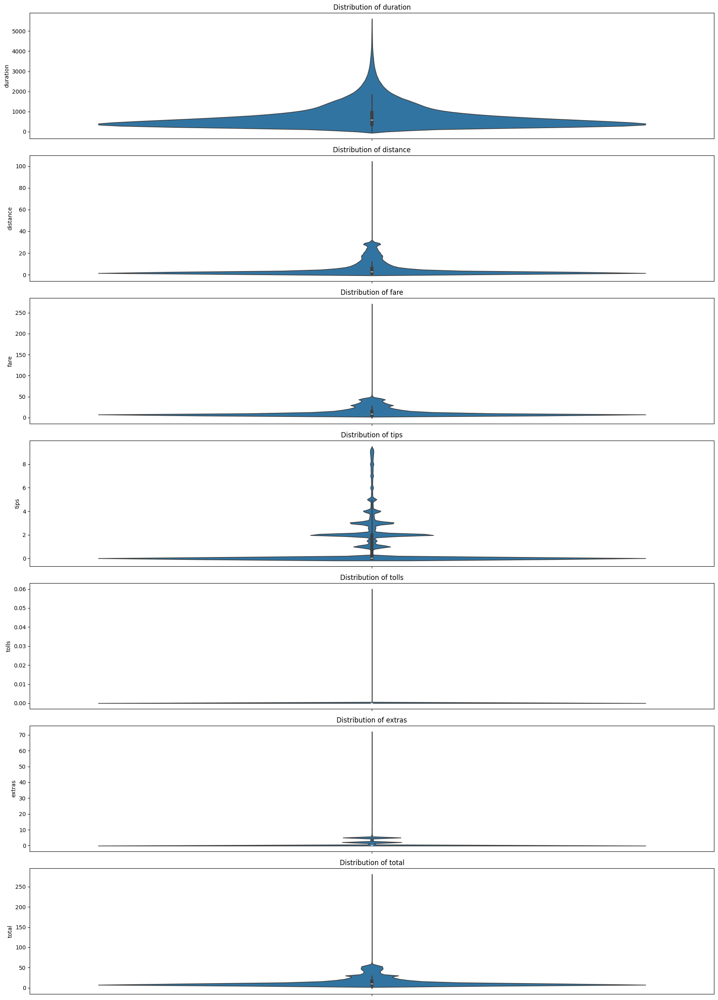

In [17]:
# Metrics to plot
metrics = ['duration', 'distance', 'fare', 'tips', 'tolls', 'extras', 'total']

# Create subplots
fig, axes = plt.subplots(nrows=len(metrics), ncols=1, figsize=(18, 25))

# Plot each metric
for i, metric in enumerate(metrics):
    sns.violinplot(ax=axes[i], data=df, y=metric)
    axes[i].set_title(f'Distribution of {metric}')
    axes[i].set_ylabel(metric)

plt.tight_layout()
plt.show()

## Summary Statistics by Taxi company, Taxi and Payment type

In [18]:
# Count the number of unique companies
count_of_companies = df['company'].nunique()

# Count the number of unique taxis
count_of_taxis = df['taxi_id'].nunique()

# Count the total number of trips
count_of_trips = df['trip_id'].count()

# Print the counts
print(f"The count of unique companies is: {count_of_companies}")
print(f"The count of unique taxis is: {count_of_taxis}")
print(f"The total count of trips is: {count_of_trips}")

The count of unique companies is: 48
The count of unique taxis is: 4150
The total count of trips is: 3129456


In [19]:
# Now, group by 'company' and calculate the required summary statistics
summary_stats_by_company = df.groupby('company').agg(
    count_trips=('trip_id', 'count'),
    num_taxis=('taxi_id', 'nunique'),
    avg_duration=('duration', 'mean'),
    avg_distance=('distance', 'mean'),
    avg_fare=('fare', 'mean'),
    avg_tips=('tips', 'mean'),
    avg_tolls=('tolls', 'mean'),
    avg_extras=('extras', 'mean'),
    avg_total=('total', 'mean'),
).reset_index()

# Sort by count of trips
summary_stats_by_company = summary_stats_by_company.sort_values(by='count_trips', ascending=False)

# Displaying the summary statistics
summary_stats_by_company.head(10)

,company,count_trips,num_taxis,avg_duration,avg_distance,avg_fare,avg_tips,avg_tolls,avg_extras,avg_total
44,Taxi Affiliation Services,854065,939,784.85,4.57,13.32,1.09,0.00,0.46,14.87
30,Flash Cab,715745,647,891.16,6.88,14.28,0.67,0.00,0.27,15.22
24,Chicago Carriage Cab Corp,246844,456,675.01,4.72,11.07,1.36,0.00,0.60,13.03
42,Sun Taxi,217854,373,691.38,5.04,11.50,1.55,0.00,0.61,13.66
34,Medallion Leasin,200430,262,697.06,4.99,11.41,1.29,0.00,0.64,13.34
29,City Service,184076,312,682.54,4.83,11.15,1.47,0.00,0.56,13.17
41,Star North Management LLC,130585,226,712.38,5.39,12.01,1.42,0.00,0.64,14.07
22,Blue Ribbon Taxi Association Inc.,115685,197,801.25,2.94,11.20,1.17,0.00,0.44,12.80
45,"Taxicab Insurance Agency, LLC",110443,174,674.55,5.05,11.66,1.38,0.00,0.61,13.65
28,Choice Taxi Association,65566,137,669.43,4.79,11.13,1.52,0.00,0.53,13.18


There is great difference in the taxi companies in Chicago. While a lot of companies have big fleets with over 100 vehicles there are some that have a lower number of vehicles in their fleet. 18 companies just operate a single vehicle. Interstingly "Flash Cab", the second biggest fleet operator gets tipped with 0.67$ far less then the competiton. Fleet Cab also has with 0.27$ average extras way less then the close competition. That these values are connected is probably not the case, as lower prices would typically drive higher tips. Flash Cab also has higer average duration and distance than their competitors. Overall Flash Cab seems like a special case.

In [20]:
# Now, group by 'company' and calculate the required summary statistics
summary_stats_by_payment = df.groupby('payment_type').agg(
    count_trips=('trip_id', 'count'),
    num_taxis=('taxi_id', 'nunique'),
    avg_duration=('duration', 'mean'),
    avg_distance=('distance', 'mean'),
    avg_fare=('fare', 'mean'),
    avg_tips=('tips', 'mean'),
    avg_tolls=('tolls', 'mean'),
    avg_extras=('extras', 'mean'),
    avg_total=('total', 'mean'),
).reset_index()

# Sort by count of trips
summary_stats_by_payment = summary_stats_by_payment.sort_values(by='count_trips', ascending=False)

# Displaying the summary statistics
summary_stats_by_payment

,payment_type,count_trips,num_taxis,avg_duration,avg_distance,avg_fare,avg_tips,avg_tolls,avg_extras,avg_total
0,Cash,1480535,4141,693.45,4.41,11.14,0.00,0.00,0.44,11.58
1,Credit Card,1216628,4102,723.50,5.15,12.38,2.80,0.00,0.66,15.83
5,Prcard,214653,1912,1187.18,9.72,18.95,0.14,0.00,0.07,19.16
7,Unknown,156791,1550,1251.99,7.95,20.50,0.02,0.00,0.08,20.59
3,Mobile,56387,2193,734.04,5.65,12.34,2.36,0.00,0.59,15.29
4,No Charge,2994,181,723.49,5.31,12.51,0.04,0.00,0.78,13.33
2,Dispute,1312,201,767.97,5.59,13.15,0.00,0.00,0.97,14.12
6,Prepaid,156,130,937.47,7.78,15.62,0.00,0.00,0.11,15.73


Not all taxis accept all payment types. Only 3 of the 4128 taxis do not accept cash. And 28 do not accept credit card. These are by far the most used payment methods with both over a million trips. Interesting are the payment types "No Charge" and "Dispute", where I assume no money was transferred. 1312 trips resulted in dispute, which have noticably higher extra fees than other payment types.

It gets clear that not for every payment type the tip is accounted. For cash the most used payment type the tips are not accounted. 

In [21]:
# Now, group by 'company' and calculate the required summary statistics
summary_stats_by_taxi = df.groupby('taxi_id').agg(
    count_trips=('trip_id', 'count'),
    avg_duration=('duration', 'mean'),
    avg_distance=('distance', 'mean'),
    avg_fare=('fare', 'mean'),
    avg_tips=('tips', 'mean'),
    avg_tolls=('tolls', 'mean'),
    avg_extras=('extras', 'mean'),
    avg_total=('total', 'mean'),
).reset_index()

# Sort by count of trips
summary_stats_by_taxi = summary_stats_by_taxi.sort_values(by='count_trips', ascending=False)

# Displaying the summary statistics
summary_stats_by_taxi.head(20)

,taxi_id,count_trips,avg_duration,avg_distance,avg_fare,avg_tips,avg_tolls,avg_extras,avg_total
1587,63874fa4b65b9636dc7098aafebb0676,6253,712.92,4.66,10.98,0.57,0.00,0.10,11.66
4033,f847458a760eb5af219a38a0ea4c80d9,5444,981.20,5.01,11.25,0.41,0.00,0.11,11.77
1351,54c45b1b2117fd701c8754ef0927d8a7,5401,561.52,3.54,9.63,0.92,0.00,0.15,10.71
3766,e95a3a7d50acdbe0e44b610d61a59f68,5385,862.63,9.43,17.57,0.44,0.00,0.20,18.21
610,28105629dc171a559d8c960fa3ad8814,4967,1081.52,6.73,15.11,0.32,0.00,0.05,15.48
313,13d72726ef9fe5d4ecfe075232cb44e7,4942,668.89,4.85,11.11,0.57,0.00,0.14,11.83
874,3883c0b0bc330c9ccafcc8df77263763,4801,603.93,4.51,10.33,0.56,0.00,0.06,10.95
799,339a8f333bd908db9b18c27a2fbc2b40,4754,966.91,9.50,17.90,0.50,0.00,0.10,18.50
2548,9e706eeefcc0a6c31a68029674bc8cae,4688,870.81,7.81,15.49,0.38,0.00,0.14,16.01
3045,bc245256cd2d0cd5b1bedc7609cb4c61,4668,955.44,4.74,11.29,0.33,0.00,0.07,11.68


# Temporal Analytics

In [22]:
def generate_time_series(start_time, end_time, freq_minutes):
    """
    Generate a time series with additional features.
    
    Parameters:
    start_time (str): The start time in 'YYYY-MM-DD HH:MM:SS' format.
    end_time (str): The end time in 'YYYY-MM-DD HH:MM:SS' format.
    freq_minutes (int): Frequency of the time series in minutes.
    
    Returns:
    DataFrame: A DataFrame containing the time series and additional features.
    """
    # Create the time series
    time_series = pd.date_range(start=start_time, end=end_time, freq=f'{freq_minutes}T')
    df = pd.DataFrame(time_series, columns=['datetime'])
    
    # Extract additional features
    df['weekday'] = df['datetime'].dt.dayofweek
    df['month'] = df['datetime'].dt.month
    df['day_of_year'] = df['datetime'].dt.dayofyear
    df['week_of_year'] = df['datetime'].dt.isocalendar().week
    df['quarter'] = df['datetime'].dt.quarter
    df['is_weekend'] = df['weekday'].apply(lambda x: 1 if x >= 5 else 0)
    df['hour'] = df['datetime'].dt.hour
    df['is_month_start'] = df['datetime'].dt.is_month_start
    df['is_month_end'] = df['datetime'].dt.is_month_end
    df['is_quarter_start'] = df['datetime'].dt.is_quarter_start
    df['is_quarter_end'] = df['datetime'].dt.is_quarter_end
    df['is_year_start'] = df['datetime'].dt.is_year_start
    df['is_year_end'] = df['datetime'].dt.is_year_end
    df['is_leap_year'] = df['datetime'].dt.is_leap_year
    
    # Define time of day segments
    def get_time_of_day(hour):
        if hour >= 5 and hour < 12:
            return 'morning'
        elif hour >= 12 and hour < 17:
            return 'afternoon'
        elif hour >= 17 and hour < 21:
            return 'evening'
        else:
            return 'night'
        
    # Define 4h segments
    def get_4h_bucket(hour):
        if hour >= 0 and hour < 4:
            return '0-4'
        elif hour >= 4 and hour < 8:
            return '4-8'
        elif hour >= 8 and hour < 12:
            return '8-12'
        elif hour >= 12 and hour < 16:
            return '12-16'
        elif hour >= 16 and hour < 20:
            return '16-20'
        else:
            return '20-24'
    
    df['time_of_day'] = df['hour'].apply(get_time_of_day)
    df['4h_bucket'] = df['hour'].apply(get_4h_bucket)
    
    
    return df

# Example usage
start_time = '2020-01-01 00:00:00'
end_time = '2021-01-01 00:00:00'
freq_minutes = 15

time_series_df = generate_time_series(start_time, end_time, freq_minutes)
time_series_df.head()

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/4153120574.py:14: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  time_series = pd.date_range(start=start_time, end=end_time, freq=f'{freq_minutes}T')


,datetime,weekday,month,day_of_year,week_of_year,quarter,is_weekend,hour,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,is_leap_year,time_of_day,4h_bucket
0,2020-01-01 00:00:00,2,1,1,1,1,0,0,True,False,True,False,True,False,True,night,0-4
1,2020-01-01 00:15:00,2,1,1,1,1,0,0,True,False,True,False,True,False,True,night,0-4
2,2020-01-01 00:30:00,2,1,1,1,1,0,0,True,False,True,False,True,False,True,night,0-4
3,2020-01-01 00:45:00,2,1,1,1,1,0,0,True,False,True,False,True,False,True,night,0-4
4,2020-01-01 01:00:00,2,1,1,1,1,0,1,True,False,True,False,True,False,True,night,0-4


In [23]:
gdf['timestamp_start'] = pd.to_datetime(gdf['timestamp_start'])
gdf['timestamp_end'] = pd.to_datetime(gdf['timestamp_end'])
gdf_ts = gdf.merge(time_series_df, left_on='timestamp_start', right_on='datetime', how = 'left')
gdf_ts.head()

,trip_id,taxi_id,timestamp_start,timestamp_end,duration,distance,fare,tips,tolls,extras,...,hour,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,is_leap_year,time_of_day,4h_bucket
0,0cd46aa628ea5f871630113eb8ba92e4,09a6eaba341c43fc653756deff43a50f,2020-01-01,2020-01-01 00:15:00,180.00,0.64,4.50,0.00,0.00,1.00,...,0,True,False,True,False,True,False,True,night,0-4
1,4fbe84436a116f11c51ef3306e7adf0c,0f66b306ebea0f05dd124bf958729b64,2020-01-01,2020-01-01 00:30:00,1723.00,1.13,12.00,0.00,0.00,0.00,...,0,True,False,True,False,True,False,True,night,0-4
2,08a197de2703972bad8877628b18bb30,5a3410255ea0041b967e74090838b14d,2020-01-01,2020-01-01 00:00:00,420.00,0.97,6.00,0.00,0.00,1.00,...,0,True,False,True,False,True,False,True,night,0-4
3,94f8c8a4624a061988e0f32e12be04c5,3049f212da83687eb7ea5cb9d3046d89,2020-01-01,2020-01-01 00:30:00,1320.00,8.21,16.75,3.85,0.00,2.00,...,0,True,False,True,False,True,False,True,night,0-4
4,dd25d5229b1ce93ea03b7c9357e6f4f9,d9d9d16f34141de38105a060abd8a90c,2020-01-01,2020-01-01 00:15:00,504.00,1.19,6.25,0.00,0.00,1.00,...,0,True,False,True,False,True,False,True,night,0-4


## Number of Taxi Trips across the Day (/Week /Year)

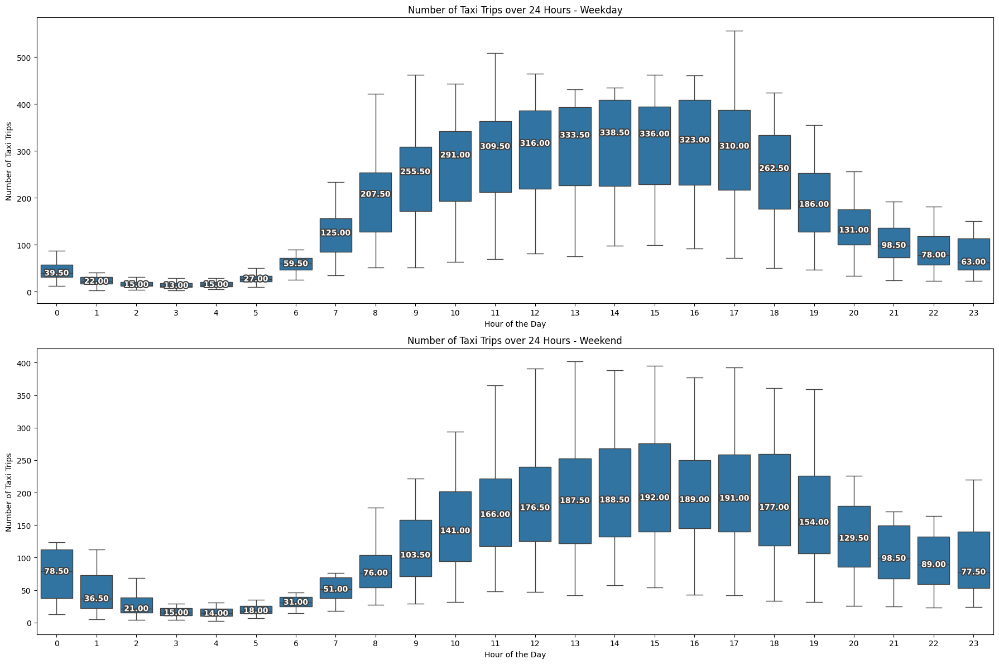

In [24]:
def add_median_labels(ax: matplotlib.axes.Axes, fmt='.2f'):
    """Add labels for the median at its location.

    Arguments:
        ax (matplotlib.axes.Axes): The matplotlib object containing the axes
            of the plot to annotate.
        fmt (String): The rounding format.
    """
    lines = ax.get_lines()
    boxes = [c for c in ax.get_children() if type(c).__name__ == 'PathPatch']
    lines_per_box = int(len(lines) / len(boxes))
    for median in lines[4:len(lines):lines_per_box]:
        x, y = (data.mean() for data in median.get_data())
        # choose value depending on horizontal or vertical plot orientation
        value = x if (median.get_xdata()[1] - median.get_xdata()[0]) == 0 else y
        text = ax.text(x, y, f'{value:{fmt}}', ha='center', va='center',
                       fontweight='bold', color='white')
        # create median-colored border around white text for contrast
        text.set_path_effects([
            path_effects.Stroke(linewidth=3, foreground=median.get_color()),
            path_effects.Normal(),
        ])

def boxplot_across_day(data, ylabel, title, ax_index):
    
    ax = axes[ax_index]
    a = sns.boxplot(x='hour', y='value', data=data, ax = ax, showfliers = False)
    add_median_labels(a)
    
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.set_xlabel('Hour of the Day')


trips_per_hour_weekday = gdf_ts[gdf_ts['is_weekend'] == 0][['day_of_year', 'hour']].groupby(by = ['day_of_year', 'hour']).size().reset_index()
trips_per_hour_weekday.columns = ['day_of_year', 'hour', 'value']

trips_per_hour_weekend = gdf_ts[gdf_ts['is_weekend'] == 1][['day_of_year', 'hour']].groupby(by = ['day_of_year', 'hour']).size().reset_index()
trips_per_hour_weekend.columns = ['day_of_year', 'hour', 'value']


fig, axes = plt.subplots(2, 1, figsize=(18, 12))
axes = axes.flatten()

boxplot_across_day(trips_per_hour_weekday, 'Number of Taxi Trips', 'Number of Taxi Trips over 24 Hours - Weekday', 0)
boxplot_across_day(trips_per_hour_weekend, 'Number of Taxi Trips', 'Number of Taxi Trips over 24 Hours - Weekend', 1)
plt.tight_layout()

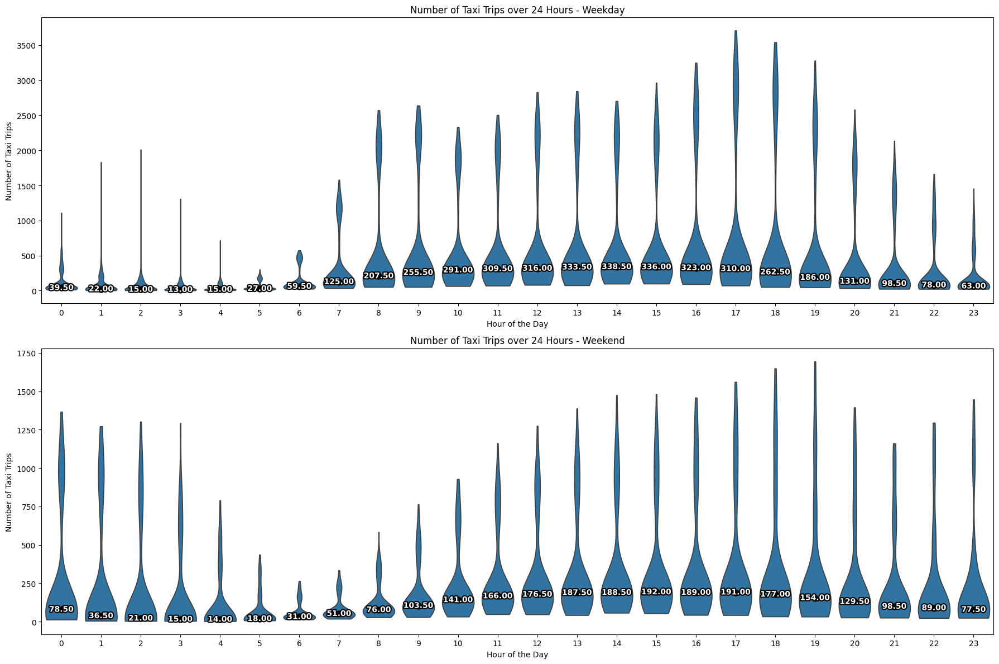

In [25]:
def add_median_labels_violin(ax: plt.Axes, data, x, y, fmt='.2f'):
    """Add labels for the median at its location.

    Arguments:
        ax (plt.Axes): The matplotlib object containing the axes
            of the plot to annotate.
        data (pd.DataFrame): The data used for plotting.
        x (str): The column name for the x-axis variable.
        y (str): The column name for the y-axis variable.
        fmt (String): The rounding format.
    """
    medians = data.groupby(x)[y].median()
    xticks = ax.get_xticks()
    for tick, median in zip(xticks, medians):
        ax.text(tick, median, f'{median:{fmt}}', ha='center', va='center',
                fontweight='bold', color='white',
                path_effects=[path_effects.Stroke(linewidth=3, foreground='black'), path_effects.Normal()])

def violinplot_across_day(data, ylabel, title, ax_index):
    ax = axes[ax_index]
    sns.violinplot(x='hour', y='value', data=data, ax=ax, inner=None, density_norm='width', cut=0)
    sns.pointplot(x='hour', y='value', data=data, ax=ax, linestyle='none', estimator=np.median, errorbar=None, color='k')
    add_median_labels_violin(ax, data, 'hour', 'value')
    
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.set_xlabel('Hour of the Day')

# Assuming gdf_ts is already defined and available
trips_per_hour_weekday = gdf_ts[gdf_ts['is_weekend'] == 0][['day_of_year', 'hour']].groupby(by=['day_of_year', 'hour']).size().reset_index()
trips_per_hour_weekday.columns = ['day_of_year', 'hour', 'value']

trips_per_hour_weekend = gdf_ts[gdf_ts['is_weekend'] == 1][['day_of_year', 'hour']].groupby(by=['day_of_year', 'hour']).size().reset_index()
trips_per_hour_weekend.columns = ['day_of_year', 'hour', 'value']

fig, axes = plt.subplots(2, 1, figsize=(18, 12))
axes = axes.flatten()

violinplot_across_day(trips_per_hour_weekday, 'Number of Taxi Trips', 'Number of Taxi Trips over 24 Hours - Weekday', 0)
violinplot_across_day(trips_per_hour_weekend, 'Number of Taxi Trips', 'Number of Taxi Trips over 24 Hours - Weekend', 1)
plt.tight_layout()
plt.show()

Interestingly, weekends have much less taxi trips than weekdays. This pattern might be explained due to usage of taxis for work commuting or during weekdays having more urgent appointments. Weekends people have more time and energy to result to other transportation methods. At night, weekends have more trips proportionally but not as much as one would think - for 10 and 11 pm it is roughly 10-15 taxi rides more on average for the whole of chicago, while at 0 it is double so roughly 40 more. Possibly due to Covid leading to lockdown, there have not been that many events and bars open at night that would lead to more taxi traffic. 

There seems to be two different distributions in one. one always between 0 and 500 and the other one clearly above that. Lets keep that in mind for our later analysis.

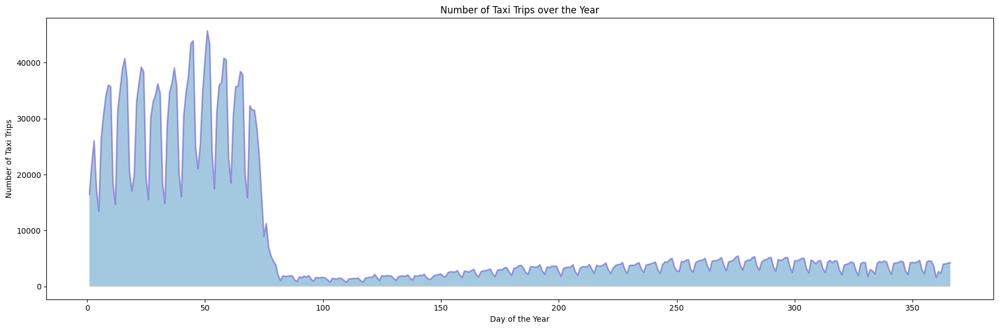

In [26]:
# Group by day_of_year to get the number of trips per day
trips_per_day = gdf_ts[['day_of_year']].groupby(by=['day_of_year']).size().reset_index()
trips_per_day.columns = ['day_of_year', 'value']

# Plot the area chart
fig, ax = plt.subplots(figsize=(18, 6))
ax.fill_between(trips_per_day['day_of_year'], trips_per_day['value'], alpha=0.4)
ax.plot(trips_per_day['day_of_year'], trips_per_day['value'], color='Slateblue', alpha=0.6, linewidth=2)

ax.set_title('Number of Taxi Trips over the Year')
ax.set_xlabel('Day of the Year')
ax.set_ylabel('Number of Taxi Trips')

plt.tight_layout()
plt.show()

this explains the two distributions seen in the graph before. Due to the corona pandemic the number of taxi trips decreased massively after the outbreak. The difference is enourmous, as not only shortly after the outbreak the taxi trips dropped, but till the end of the year the trips stayed at a minimum of what they have been before.

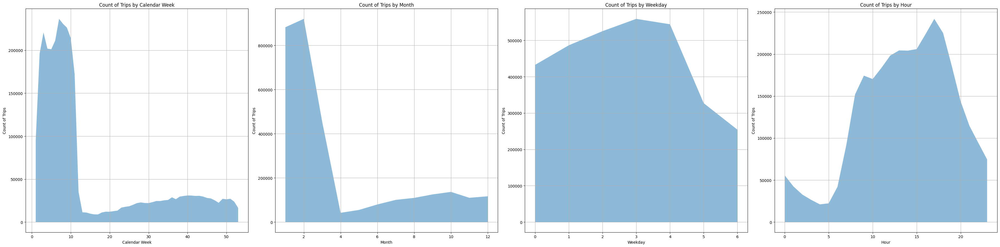

In [27]:
# Define function to calculate trip counts by various time metrics
def calculate_trip_counts(df, group_by):
    return df.groupby(group_by).size().rename('count_trips')

# Calculate trip counts for various time metrics
weekly_trip_counts = calculate_trip_counts(gdf_ts, 'week_of_year')
monthly_trip_counts = calculate_trip_counts(gdf_ts, 'month')
weekday_trip_counts = calculate_trip_counts(gdf_ts, 'weekday')
hourly_trip_counts = calculate_trip_counts(gdf_ts, 'hour')
time_of_day_trip_counts = calculate_trip_counts(gdf_ts, 'time_of_day')
bucket_trip_counts = calculate_trip_counts(gdf_ts, '4h_bucket')

# Plotting the trip count data
fig, axs = plt.subplots(1, 4, figsize=(36, 9))

# Define the title size to prevent overlap
title_size = 12

# Plot trip counts for calendar weeks
axs[0].fill_between(weekly_trip_counts.index, weekly_trip_counts, alpha=0.5)
axs[0].set_title('Count of Trips by Calendar Week', fontsize=title_size)
axs[0].set_xlabel('Calendar Week')
axs[0].set_ylabel('Count of Trips')
axs[0].grid(True)

# Plot trip counts for months
axs[1].fill_between(monthly_trip_counts.index, monthly_trip_counts, alpha=0.5)
axs[1].set_title('Count of Trips by Month', fontsize=title_size)
axs[1].set_xlabel('Month')
axs[1].set_ylabel('Count of Trips')
axs[1].grid(True)

# Plot trip counts for weekdays
axs[2].fill_between(weekday_trip_counts.index, weekday_trip_counts,alpha=0.5)
axs[2].set_title('Count of Trips by Weekday', fontsize=title_size)
axs[2].set_xlabel('Weekday')
axs[2].set_ylabel('Count of Trips')
axs[2].grid(True)

# Plot trip counts for hours
axs[3].fill_between(hourly_trip_counts.index, hourly_trip_counts, alpha=0.5)
axs[3].set_title('Count of Trips by Hour', fontsize=title_size)
axs[3].set_xlabel('Hour')
axs[3].set_ylabel('Count of Trips')
axs[3].grid(True)

plt.tight_layout()
plt.show()

## Mean Trip Duration per Kilometer across the Day (/Week /Year)

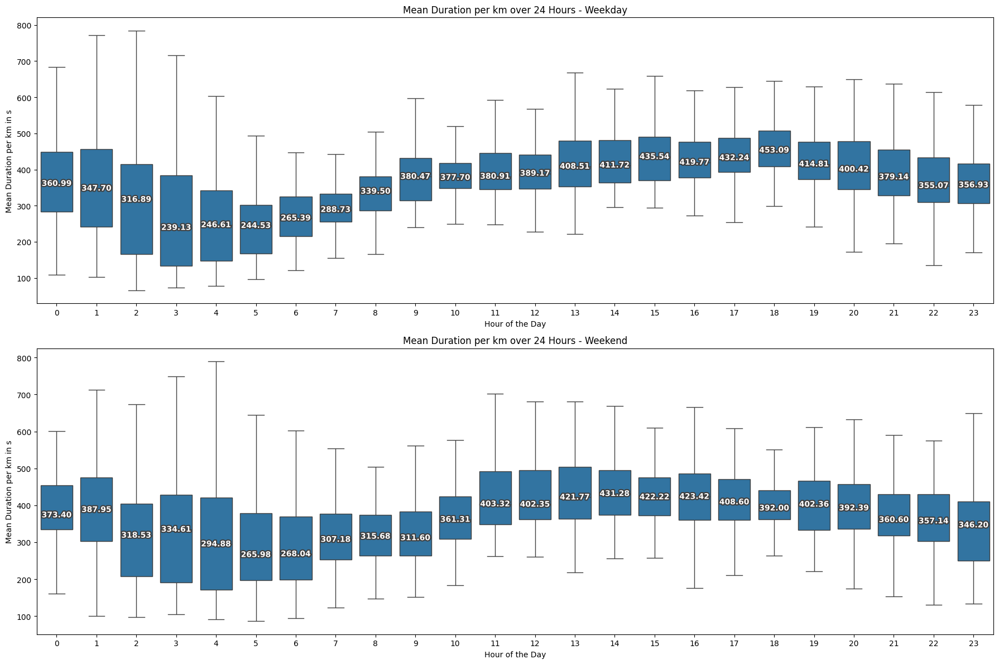

In [28]:
trip_length_per_hour_weekday = gdf_ts[(gdf_ts['is_weekend'] == 0) & (gdf_ts['distance'] != 0) & gdf_ts['duration'] != 0][['day_of_year', 'hour', 'distance', 'duration']]
trip_length_per_hour_weekday['duration_per_km'] = trip_length_per_hour_weekday['duration'] / trip_length_per_hour_weekday['distance']
trip_length_per_hour_weekday= trip_length_per_hour_weekday[['day_of_year', 'hour', 'duration_per_km']].groupby(by = ['day_of_year', 'hour']).mean().reset_index()
trip_length_per_hour_weekday.columns = ['day_of_year', 'hour', 'value']

trip_length_per_hour_weekend = gdf_ts[(gdf_ts['is_weekend'] == 1) & (gdf_ts['distance'] != 0) & gdf_ts['duration'] != 0][['day_of_year', 'hour', 'distance', 'duration']]
trip_length_per_hour_weekend['duration_per_km'] = trip_length_per_hour_weekend['duration'] / trip_length_per_hour_weekend['distance']
trip_length_per_hour_weekend= trip_length_per_hour_weekend[['day_of_year', 'hour', 'duration_per_km']].groupby(by = ['day_of_year', 'hour']).mean().reset_index()
trip_length_per_hour_weekend.columns = ['day_of_year', 'hour', 'value']

fig, axes = plt.subplots(2, 1, figsize=(18, 12))
axes = axes.flatten()

boxplot_across_day(trip_length_per_hour_weekday, 'Mean Duration per km in s', 'Mean Duration per km over 24 Hours - Weekday', 0)
boxplot_across_day(trip_length_per_hour_weekend, 'Mean Duration per km in s', 'Mean Duration per km over 24 Hours - Weekend', 1)
plt.tight_layout()

On weekdays we can see that the peak is around 6pm, which is usually the rush hour of commuting. Therefore, the time per km is the highest at that time. For weekends, from 11-20 the time per km stays the same indicating typical shopping hours and the most active time of the weekend.

Lets check if we can spot similar to the total taxi trips a heavy influence of the corona pandemic:

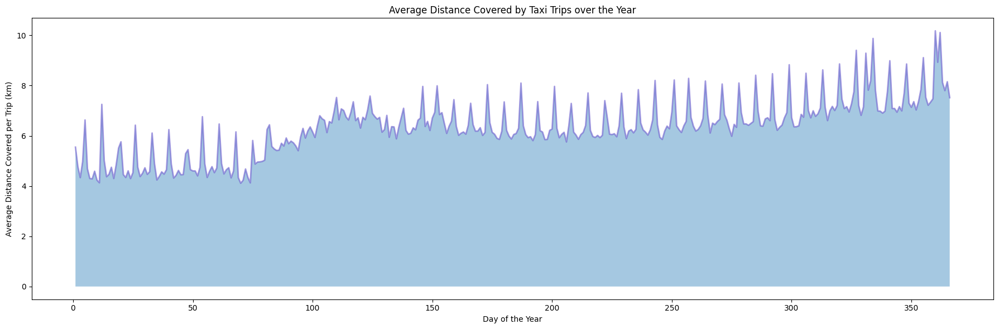

In [29]:
# Group by day_of_year to get the average distance covered per trip per day
average_distance_per_day = gdf_ts[['day_of_year', 'distance']].groupby(by=['day_of_year']).mean().reset_index()
average_distance_per_day.columns = ['day_of_year', 'average_distance']

# Plot the area chart
fig, ax = plt.subplots(figsize=(18, 6))
ax.fill_between(average_distance_per_day['day_of_year'], average_distance_per_day['average_distance'], alpha=0.4)
ax.plot(average_distance_per_day['day_of_year'], average_distance_per_day['average_distance'], color='Slateblue', alpha=0.6, linewidth=2)

ax.set_title('Average Distance Covered by Taxi Trips over the Year')
ax.set_xlabel('Day of the Year')
ax.set_ylabel('Average Distance Covered per Trip (km)')

plt.tight_layout()
plt.show()


Interestingly the average distance increased a lot over the year. Till the corona outbreak the develoment was quite steady, but afterwards it bumps and follows on a higher level. Why thi is the case can only be speculated. It could be because people might only get on Taxis if they really need to and lower distances they may can handle also through other transportation (like car) where they dont interact with other people.

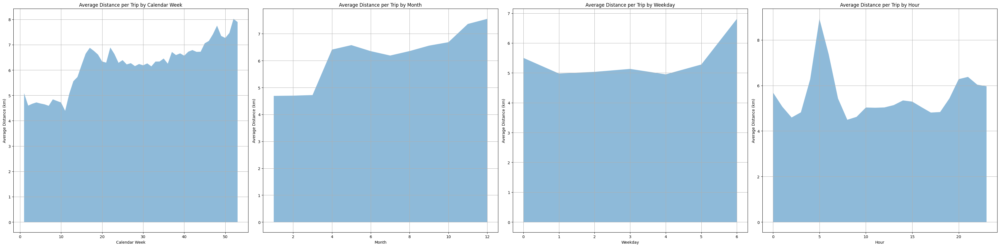

In [30]:
# Define function to calculate average trip distance by various time metrics
def calculate_average_distance(df, group_by):
    return df.groupby(group_by)['distance'].mean().rename('average_distance')

# Calculate average trip distance for various time metrics
weekly_avg_distance = calculate_average_distance(gdf_ts, 'week_of_year')
monthly_avg_distance = calculate_average_distance(gdf_ts, 'month')
weekday_avg_distance = calculate_average_distance(gdf_ts, 'weekday')
hourly_avg_distance = calculate_average_distance(gdf_ts, 'hour')

# Plotting the average distance data
fig, axs = plt.subplots(1, 4, figsize=(36, 9))

# Define the title size to prevent overlap
title_size = 12

# Plot average distance for calendar weeks
axs[0].fill_between(weekly_avg_distance.index, weekly_avg_distance, alpha=0.5)
axs[0].set_title('Average Distance per Trip by Calendar Week', fontsize=title_size)
axs[0].set_xlabel('Calendar Week')
axs[0].set_ylabel('Average Distance (km)')
axs[0].grid(True)

# Plot average distance for months
axs[1].fill_between(monthly_avg_distance.index, monthly_avg_distance, alpha=0.5)
axs[1].set_title('Average Distance per Trip by Month', fontsize=title_size)
axs[1].set_xlabel('Month')
axs[1].set_ylabel('Average Distance (km)')
axs[1].grid(True)

# Plot average distance for weekdays
axs[2].fill_between(weekday_avg_distance.index, weekday_avg_distance, alpha=0.5)
axs[2].set_title('Average Distance per Trip by Weekday', fontsize=title_size)
axs[2].set_xlabel('Weekday')
axs[2].set_ylabel('Average Distance (km)')
axs[2].grid(True)

# Plot average distance for hours
axs[3].fill_between(hourly_avg_distance.index, hourly_avg_distance, alpha=0.5)
axs[3].set_title('Average Distance per Trip by Hour', fontsize=title_size)
axs[3].set_xlabel('Hour')
axs[3].set_ylabel('Average Distance (km)')
axs[3].grid(True)

plt.tight_layout()
plt.show()


The distance peaks at 5pm in the morning and on Sundays. over the day (working hours) the distance is the smallest. This could be due to smaller business trips or communtes top and from work.

## Mean Trip Distance per Kilometer against Duration across the Day (/Week /Year)

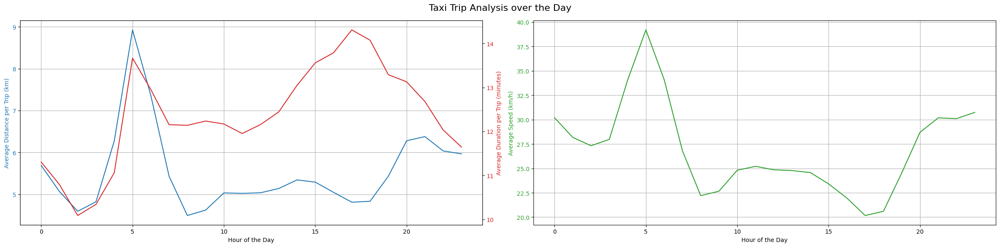

In [31]:
# Group by hour to calculate the mean distance and mean duration (convert from seconds to minutes)
average_metrics_per_hour = gdf_ts.groupby('hour').agg({'distance': 'mean', 'duration': 'mean'}).reset_index()
average_metrics_per_hour['average_duration_minutes'] = average_metrics_per_hour['duration'] / 60  # convert seconds to minutes
average_metrics_per_hour['average_speed_kmh'] = average_metrics_per_hour['distance'] / (average_metrics_per_hour['duration'] / 3600)  # convert seconds to hours

# Plotting the average distance, duration, and speed data
fig, axs = plt.subplots(1, 2, figsize=(24, 6))

# Plot average distance and duration
ax1 = axs[0]
color = 'tab:blue'
ax1.set_xlabel('Hour of the Day')
ax1.set_ylabel('Average Distance per Trip (km)', color=color)
ax1.plot(average_metrics_per_hour['hour'], average_metrics_per_hour['distance'], color=color, label='Average Distance')
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(True)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:red'
ax2.set_ylabel('Average Duration per Trip (minutes)', color=color)  # we already handled the x-label with ax1
ax2.plot(average_metrics_per_hour['hour'], average_metrics_per_hour['average_duration_minutes'], color=color, label='Average Duration')
ax2.tick_params(axis='y', labelcolor=color)

# Plot average speed
ax3 = axs[1]
color = 'tab:green'
ax3.set_xlabel('Hour of the Day')
ax3.set_ylabel('Average Speed (km/h)', color=color)
ax3.plot(average_metrics_per_hour['hour'], average_metrics_per_hour['average_speed_kmh'], color=color, label='Average Speed')
ax3.tick_params(axis='y', labelcolor=color)
ax3.grid(True)

fig.suptitle('Taxi Trip Analysis over the Day', fontsize=16)
fig.tight_layout()
plt.show()

We observe that both the average distance per trip and the average duration per trip peak around 5 AM, indicating that trips during this early morning period tend to be longer and take more time. This could be due to less traffic congestion, allowing for longer journeys without significant delays. The average speed (km/h) also peaks around 5 AM, further supporting the assumption that less traffic during this time allows for faster travel. The sharp decline in average speed after this peak suggests increasing traffic congestion as the day progresses, especially during typical rush hours in the morning and afternoon. In the evening traffic seem to be relaxed again allowing for faster average speed.

Due to less taxi trips after the corona outbreak we can assume that the traffic in general decreases. This may has an effect on the km/h, lets check that

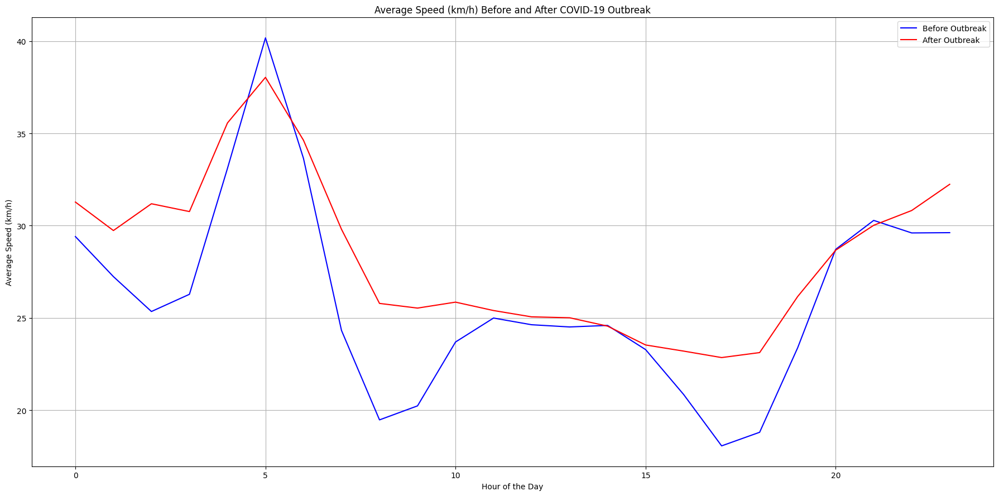

In [32]:
# Define the outbreak date
outbreak_date = pd.Timestamp('2020-03-01')

# Split the data into two periods: before and after the outbreak
before_outbreak = gdf_ts[gdf_ts['datetime'] < outbreak_date]
after_outbreak = gdf_ts[gdf_ts['datetime'] >= outbreak_date]

# Calculate average metrics for each hour before the outbreak
average_metrics_before = before_outbreak.groupby('hour').agg({'distance': 'mean', 'duration': 'mean'}).reset_index()
average_metrics_before['average_duration_minutes'] = average_metrics_before['duration'] / 60  # convert seconds to minutes
average_metrics_before['average_speed_kmh'] = average_metrics_before['distance'] / (average_metrics_before['duration'] / 3600)  # convert seconds to hours

# Calculate average metrics for each hour after the outbreak
average_metrics_after = after_outbreak.groupby('hour').agg({'distance': 'mean', 'duration': 'mean'}).reset_index()
average_metrics_after['average_duration_minutes'] = average_metrics_after['duration'] / 60  # convert seconds to minutes
average_metrics_after['average_speed_kmh'] = average_metrics_after['distance'] / (average_metrics_after['duration'] / 3600)  # convert seconds to hours

# Plotting the average speed before and after the outbreak
fig, ax = plt.subplots(figsize=(18, 9))

ax.plot(average_metrics_before['hour'], average_metrics_before['average_speed_kmh'], color='blue', label='Before Outbreak')
ax.plot(average_metrics_after['hour'], average_metrics_after['average_speed_kmh'], color='red', label='After Outbreak')

ax.set_title('Average Speed (km/h) Before and After COVID-19 Outbreak')
ax.set_xlabel('Hour of the Day')
ax.set_ylabel('Average Speed (km/h)')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()


the average speed (km/h) of taxi trips generally increased after the COVID-19 outbreak, particularly during early morning hours (around 4-6 AM) and late evening hours (around 8-10 PM). This increase in average speed can likely be attributed to decreased traffic congestion due to fewer overall trips and less vehicular traffic on the roads.

But especially the bumps during the work commute times are very much flattend out, meaning probably less traffic leading to less traffic jams.

## Fare with Tipps, Tolls and Extras across the Day (/Week /Year)

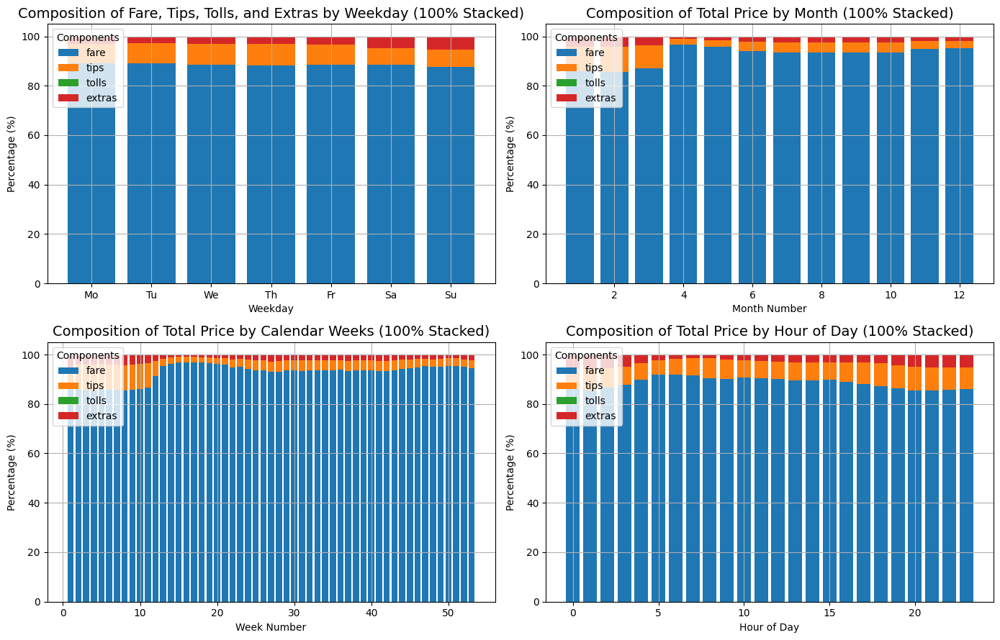

In [33]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure 'timestamp_start' is in datetime format
gdf['timestamp_start'] = pd.to_datetime(gdf['timestamp_start'])

# Extract relevant time periods
gdf['day_of_week'] = gdf['timestamp_start'].dt.day_name().str[:2]  # Abbreviated weekday names
gdf['month'] = gdf['timestamp_start'].dt.month
gdf['year_week'] = gdf['timestamp_start'].dt.isocalendar().week
gdf['date'] = gdf['timestamp_start'].dt.date
gdf['hour'] = gdf['timestamp_start'].dt.hour

# Drop the existing 'day_of_week' index to avoid conflicts
gdf = gdf.reset_index(drop=True)

# Select only the numeric columns for aggregation
numeric_columns = ['fare', 'tips', 'tolls', 'extras']

# Function to calculate percentages
def calculate_percentages(df, group_by, numeric_columns):
    totals = df.groupby(group_by)[numeric_columns].sum()
    percentages = totals.div(totals.sum(axis=1), axis=0) * 100
    return percentages

# Calculate percentages for various time metrics
daily_totals_percent = calculate_percentages(gdf, 'day_of_week', numeric_columns)
monthly_totals_percent = calculate_percentages(gdf, 'month', numeric_columns)
weekly_totals_percent = calculate_percentages(gdf, 'year_week', numeric_columns)
date_totals_percent = calculate_percentages(gdf, 'date', numeric_columns)
hourly_totals_percent = calculate_percentages(gdf, 'hour', numeric_columns)

# Reorder the DataFrame based on the days of the week
days_order = ['Mo', 'Tu', 'We', 'Th', 'Fr', 'Sa', 'Su']
daily_totals_percent = daily_totals_percent.reindex(days_order)

# Define a function to plot stacked bar charts
def plot_stacked_bars(ax, data, title, xlabel, ylabel, colors):
    bottom = None
    for i, column in enumerate(data.columns):
        if bottom is None:
            ax.bar(data.index, data[column], label=column, color=colors[i])
            bottom = data[column]
        else:
            ax.bar(data.index, data[column], bottom=bottom, label=column, color=colors[i])
            bottom += data[column]
    ax.set_title(title, fontsize=14)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend(title='Components', loc='upper left')
    ax.grid(True)

# Define colors for the stacked bars
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

# Create a figure with subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 9))

# Plot daily totals (percent)
plot_stacked_bars(axs[0, 0], daily_totals_percent, 'Composition of Fare, Tips, Tolls, and Extras by Weekday (100% Stacked)', 'Weekday', 'Percentage (%)', colors)

# Plot monthly totals (percent)
plot_stacked_bars(axs[0, 1], monthly_totals_percent, 'Composition of Total Price by Month (100% Stacked)', 'Month Number', 'Percentage (%)', colors)

# Plot weekly totals (percent)
plot_stacked_bars(axs[1, 0], weekly_totals_percent, 'Composition of Total Price by Calendar Weeks (100% Stacked)', 'Week Number', 'Percentage (%)', colors)

# Plot hourly totals (percent)
plot_stacked_bars(axs[1, 1], hourly_totals_percent, 'Composition of Total Price by Hour of Day (100% Stacked)', 'Hour of Day', 'Percentage (%)', colors)

plt.tight_layout()
plt.show()

A lot of different insights can be taken from the graphs. As already observed before we can see that tolls are nearly not charged at all and therefore are also here not visible. Tips tend to be a higher proportion during weekdays, with a slight increase on Fridays, possibly reflecting a tendency for higher tipping before the weekend. Extras appear to peak during late evening hours (5 PM to 8 PM), which might be associated with additional charges like night surcharges or extra stops. Also on weekends the extras are a bit higher than during weekdays.

The Covid-19 outbreak also seemed to have great impact especially on the tipps and extras. Overall the tipps and Extras were way higher in the beginning of the year than at the end. After the corona outbreak the values for both metrics dropped massively.

Earlier we saw that cash and card payments are both options and that cash tipps are not registered (basically only cash and mobile tipps are registered), which could influence the distribution, let's check therefore the distribution of the different card payment methods over the year:

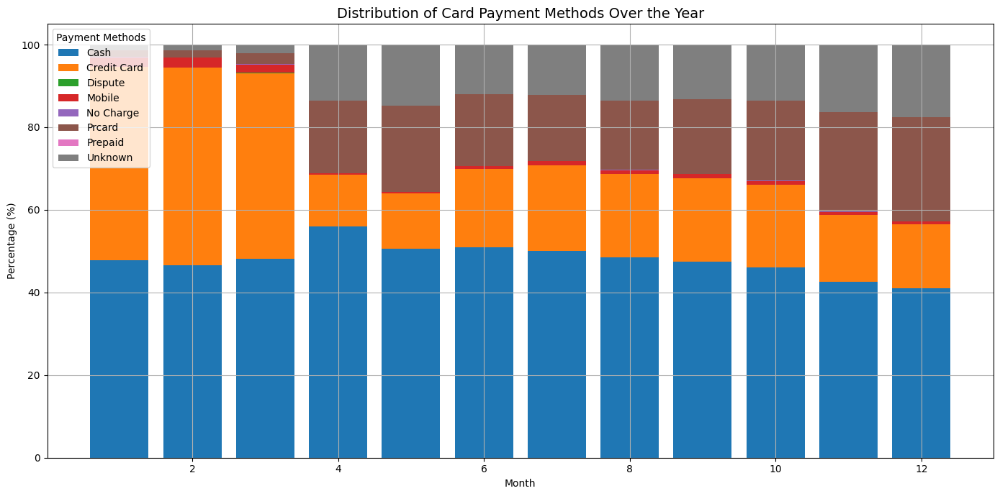

In [34]:
# Assuming 'payment_method' is the column that indicates the type of payment used
# Replace 'payment_method' with the actual column name if different
payment_method_column = 'payment_type'

# Group by month and payment method to calculate the count of each payment method per month
payment_distribution = gdf.groupby(['month', payment_method_column]).size().unstack(fill_value=0)

# Calculate the percentage distribution
payment_distribution_percent = payment_distribution.div(payment_distribution.sum(axis=1), axis=0) * 100

# Define a function to plot stacked bar charts
def plot_stacked_bars(ax, data, title, xlabel, ylabel, colors):
    bottom = None
    for i, column in enumerate(data.columns):
        if bottom is None:
            ax.bar(data.index, data[column], label=column, color=colors[i])
            bottom = data[column]
        else:
            ax.bar(data.index, data[column], bottom=bottom, label=column, color=colors[i])
            bottom += data[column]
    ax.set_title(title, fontsize=14)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend(title='Payment Methods', loc='upper left')
    ax.grid(True)

# Define colors for the stacked bars
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

# Plot the distribution of payment methods over the year
fig, ax = plt.subplots(figsize=(14, 7))

plot_stacked_bars(ax, payment_distribution_percent, 'Distribution of Card Payment Methods Over the Year', 'Month', 'Percentage (%)', colors)

plt.tight_layout()
plt.show()

The card payments decreased heavily after the COVID-19 outbreak, this probably leads to the smaller amount of tips, as the dominating payment methods do not register tips.

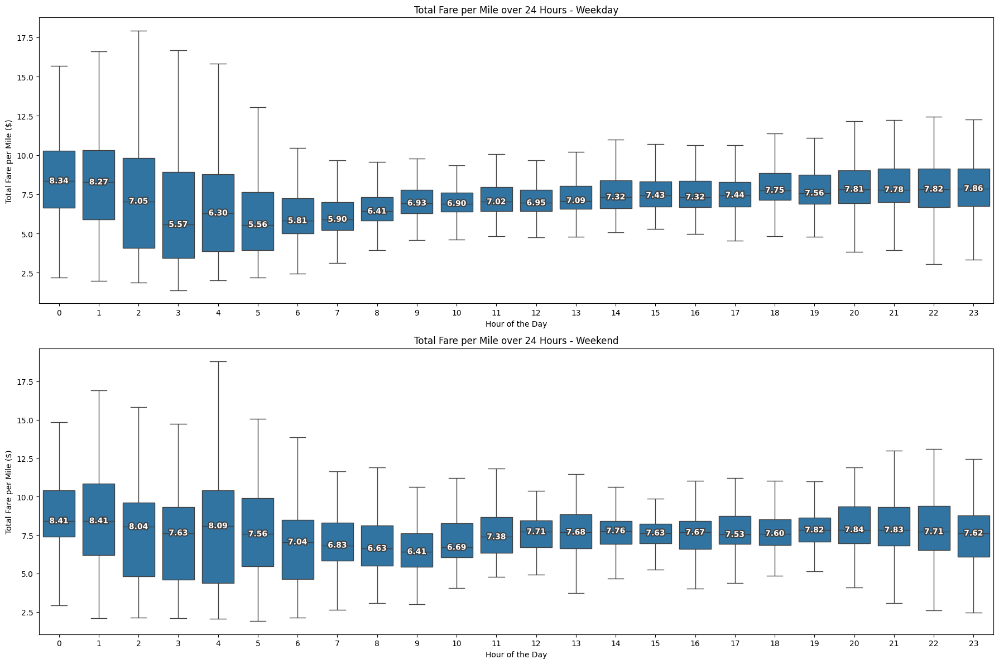

In [35]:
# Data preparation for total per mile
gdf_ts['total_per_mile'] = gdf_ts['total'] / gdf_ts['distance']
total_per_mile_per_hour_weekday = gdf_ts[(gdf_ts['is_weekend'] == 0) & (gdf_ts['distance'] != 0)][['day_of_year', 'hour', 'total_per_mile']]
total_per_mile_per_hour_weekday = total_per_mile_per_hour_weekday.groupby(by=['day_of_year', 'hour']).mean().reset_index()
total_per_mile_per_hour_weekday.columns = ['day_of_year', 'hour', 'value']

total_per_mile_per_hour_weekend = gdf_ts[(gdf_ts['is_weekend'] == 1) & (gdf_ts['distance'] != 0)][['day_of_year', 'hour', 'total_per_mile']]
total_per_mile_per_hour_weekend = total_per_mile_per_hour_weekend.groupby(by=['day_of_year', 'hour']).mean().reset_index()
total_per_mile_per_hour_weekend.columns = ['day_of_year', 'hour', 'value']

# Plotting
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
axes = axes.flatten()

boxplot_across_day(total_per_mile_per_hour_weekday, 'Total Fare per Mile ($)', 'Total Fare per Mile over 24 Hours - Weekday', 0)
boxplot_across_day(total_per_mile_per_hour_weekend, 'Total Fare per Mile ($)', 'Total Fare per Mile over 24 Hours - Weekend', 1)
plt.tight_layout()
plt.show()

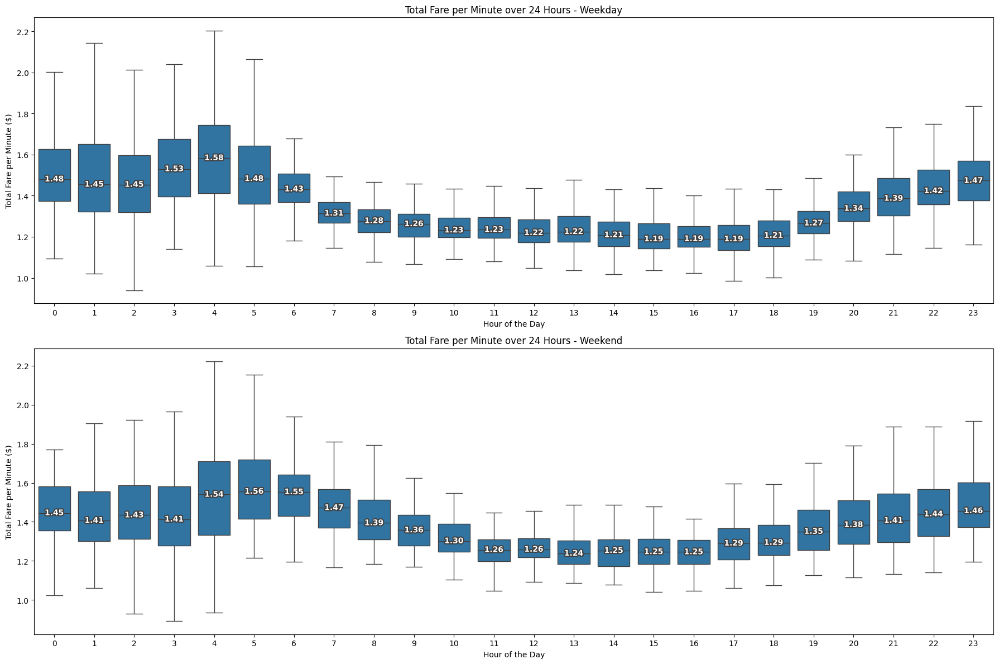

In [36]:
# Data preparation for total per minute
gdf_ts['total_per_minute'] = gdf_ts['total'] / (gdf_ts['duration'] / 60)
total_per_minute_per_hour_weekday = gdf_ts[(gdf_ts['is_weekend'] == 0) & (gdf_ts['duration'] != 0)][['day_of_year', 'hour', 'total_per_minute']]
total_per_minute_per_hour_weekday = total_per_minute_per_hour_weekday.groupby(by=['day_of_year', 'hour']).mean().reset_index()
total_per_minute_per_hour_weekday.columns = ['day_of_year', 'hour', 'value']

total_per_minute_per_hour_weekend = gdf_ts[(gdf_ts['is_weekend'] == 1) & (gdf_ts['duration'] != 0)][['day_of_year', 'hour', 'total_per_minute']]
total_per_minute_per_hour_weekend = total_per_minute_per_hour_weekend.groupby(by=['day_of_year', 'hour']).mean().reset_index()
total_per_minute_per_hour_weekend.columns = ['day_of_year', 'hour', 'value']

fig, axes = plt.subplots(2, 1, figsize=(18, 12))
axes = axes.flatten()

boxplot_across_day(total_per_minute_per_hour_weekday, 'Total Fare per Minute ($)', 'Total Fare per Minute over 24 Hours - Weekday', 0)
boxplot_across_day(total_per_minute_per_hour_weekend, 'Total Fare per Minute ($)', 'Total Fare per Minute over 24 Hours - Weekend', 1)
plt.tight_layout()
plt.show()

## Idle Time of Taxis across the Day

In [37]:
gdf_idle = gdf_ts[gdf_ts.duplicated(subset=['taxi_id'], keep = False)]
gdf_idle = gdf_idle.sort_values(by=['taxi_id', 'timestamp_start', 'timestamp_end'])
gdf_idle['next_start_time'] = gdf_idle.groupby('taxi_id')['timestamp_start'].shift(-1)
gdf_idle['idle_time'] = (gdf_idle['next_start_time'] - gdf_idle['timestamp_end']).dt.total_seconds() / 60.0  # Idle time in minutes

# Handle cases where there is no next ride
gdf_idle['idle_time'] = gdf_idle['idle_time'].fillna(0)
gdf_idle

,trip_id,taxi_id,timestamp_start,timestamp_end,duration,distance,fare,tips,tolls,extras,...,is_quarter_end,is_year_start,is_year_end,is_leap_year,time_of_day,4h_bucket,total_per_mile,total_per_minute,next_start_time,idle_time
51745,bd5d926d7c6b6d0a67811784b44184e8,0006cebe7da8b1d1bba5d1e1ecae8181,2020-01-03 15:30:00,2020-01-03 16:15:00,2333.00,24.19,39.75,0.00,0.00,5.00,...,False,False,False,True,afternoon,12-16,1.85,1.15,2020-01-03 19:15:00,180.00
59373,2782ecae58768cfd233887aef7a145f8,0006cebe7da8b1d1bba5d1e1ecae8181,2020-01-03 19:15:00,2020-01-03 19:45:00,1617.00,23.79,37.50,8.40,0.00,4.00,...,False,False,False,True,evening,16-20,2.10,1.85,2020-01-03 23:30:00,225.00
64230,fed0bc7db12802d64f6fb292eb39b635,0006cebe7da8b1d1bba5d1e1ecae8181,2020-01-03 23:30:00,2020-01-04 00:15:00,2617.00,29.35,47.50,0.00,0.00,4.00,...,False,False,False,True,night,20-24,1.75,1.18,2020-01-04 12:45:00,750.00
70073,d79755e24df821b393945e33be7acafb,0006cebe7da8b1d1bba5d1e1ecae8181,2020-01-04 12:45:00,2020-01-04 13:15:00,1959.00,25.20,40.25,6.00,0.00,5.00,...,False,False,False,True,afternoon,12-16,2.03,1.57,2020-01-04 19:30:00,375.00
77447,b6c1fbb8acdd5bf051a6ca27ccd31f97,0006cebe7da8b1d1bba5d1e1ecae8181,2020-01-04 19:30:00,2020-01-04 20:00:00,1327.00,22.05,34.75,0.00,0.00,4.00,...,False,False,False,True,evening,16-20,1.76,1.75,2020-01-04 21:00:00,60.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2092445,ae94d49b177ab8accf44cf941e24b6d0,ffff0c3db2a7ba86bdb418a267551dff,2020-03-10 19:30:00,2020-03-10 19:45:00,1314.00,8.00,16.25,3.35,0.00,0.00,...,False,False,False,True,evening,16-20,2.45,0.89,2020-03-11 23:15:00,1650.00
2129088,0fb2f63924db1d990116f29027717423,ffff0c3db2a7ba86bdb418a267551dff,2020-03-11 23:15:00,2020-03-11 23:30:00,1335.00,28.03,42.50,7.05,0.00,4.00,...,False,False,False,True,night,20-24,1.91,2.41,2020-03-11 23:30:00,0.00
2129251,433f1a3a0ea24315b8aa3462ec3a52a9,ffff0c3db2a7ba86bdb418a267551dff,2020-03-11 23:30:00,2020-03-11 23:45:00,429.00,2.78,7.50,0.00,0.00,0.00,...,False,False,False,True,night,20-24,2.70,1.05,2020-03-11 23:45:00,0.00
2129407,a9a95029e32f4538253948043593428f,ffff0c3db2a7ba86bdb418a267551dff,2020-03-11 23:45:00,2020-03-12 00:00:00,1009.00,8.35,16.50,0.00,0.00,0.00,...,False,False,False,True,night,20-24,1.98,0.98,2020-03-12 20:15:00,1215.00


We need to remove or handle values that seem very high and likely result from breaks or shift changes. This helps to ensure the idle time data is representative of typical working conditions for the taxis and not skewed by non-working periods.

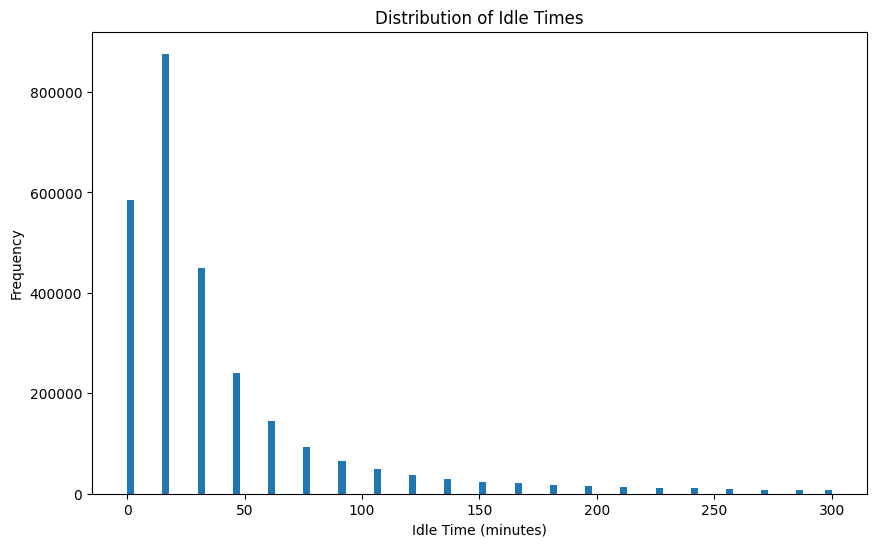

In [38]:
# Plot distribution of idle times
plt.figure(figsize=(10, 6))
gdf_idle['idle_time'].plot(kind='hist', bins=100, range=(0, 300))
plt.title('Distribution of Idle Times')
plt.xlabel('Idle Time (minutes)')
plt.ylabel('Frequency')
plt.show()

At more than 75 minutes of idle time the frequency barely changes, indicating that most of these are just regular breaks or shift changes. We have to check whether we can identify lunch breaks and remove them.

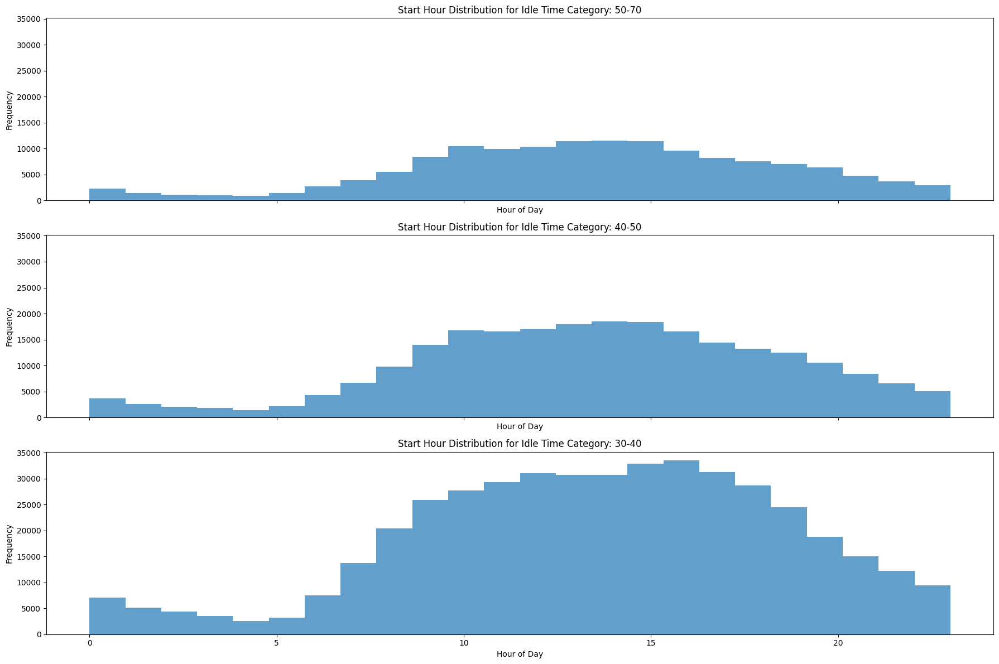

In [39]:
# Function to categorize idle times into ranges
def categorize_idle_time(idle_time):
    if 20 <= idle_time < 30:
        return '20-30'
    elif 30 <= idle_time < 40:
        return '30-40'
    elif 40 <= idle_time < 50:
        return '40-50'
    elif 50 <= idle_time < 70:
        return '50-70'
    else:
        return 'other'

# Categorize idle times
gdf_idle['idle_time_category'] = gdf_idle['idle_time'].apply(categorize_idle_time)

categories = [cat for cat in gdf_idle['idle_time_category'].unique() if cat != 'other']

num_categories = len(categories)
fig, axes = plt.subplots(num_categories, 1, figsize=(18, 4 * num_categories), sharex=True, sharey = True)

for ax, category in zip(axes, categories):
    data = gdf_idle[gdf_idle['idle_time_category'] == category]
    ax.hist(data['hour'], bins=24, alpha=0.7)
    ax.set_title(f'Start Hour Distribution for Idle Time Category: {category}')
    ax.set_xlabel('Hour of Day')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.show()


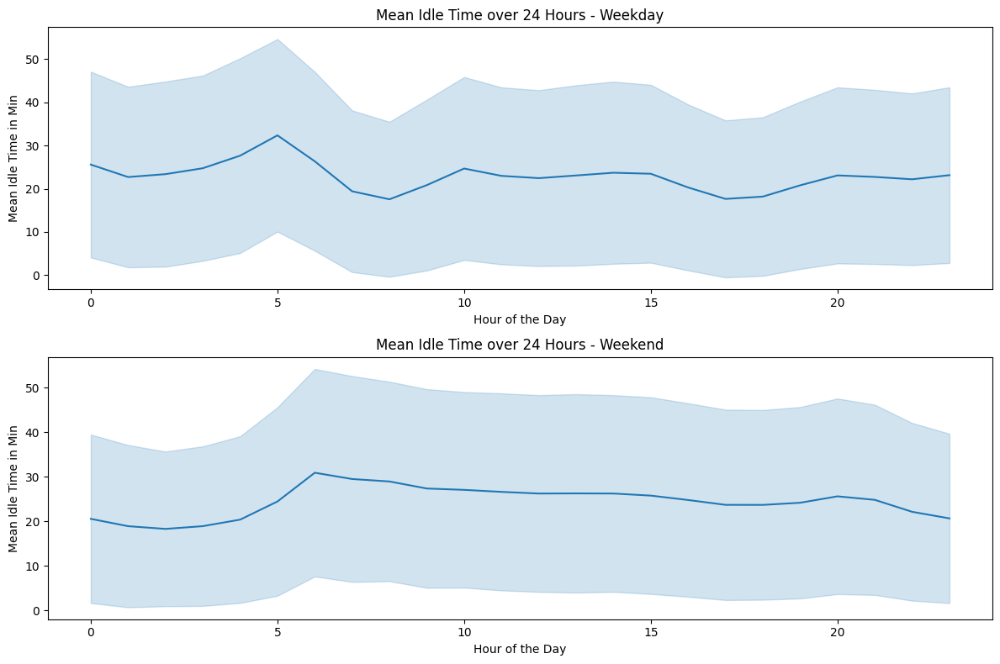

In [40]:
def lineplot_across_day(data, ylabel, title, ax_index):
    ax = axes[ax_index]
    sns.lineplot(x='hour', y='value', data=data, ax=ax, errorbar='sd')
    
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.set_xlabel('Hour of the Day')

gdf_idle_cleaned_weekday = gdf_idle[(gdf_idle['idle_time'] <= 75) & (gdf_idle['is_weekend'] == 0)][['day_of_year', 'hour', 'idle_time']]
gdf_idle_cleaned_weekday.columns = ['day_of_year', 'hour', 'value']

gdf_idle_cleaned_weekend = gdf_idle[(gdf_idle['idle_time'] <= 75) & (gdf_idle['is_weekend'] == 1)][['day_of_year', 'hour', 'idle_time']]
gdf_idle_cleaned_weekend.columns = ['day_of_year', 'hour', 'value']

fig, axes = plt.subplots(2, 1, figsize=(12, 8))
axes = axes.flatten()

lineplot_across_day(gdf_idle_cleaned_weekday, 'Mean Idle Time in Min', 'Mean Idle Time over 24 Hours - Weekday', 0)
lineplot_across_day(gdf_idle_cleaned_weekend, 'Mean Idle Time in Min', 'Mean Idle Time over 24 Hours - Weekend', 1)
plt.tight_layout()

There are two plunges in the weekday plot at roughly 6-9 am and 4-6pm, which are typical rush hours. During these times many people might order taxis for commuting purposes, resulting in less idle times for the taxis. However, the plunges are rather small possibly due to less trafic since more people work from home because of covid.

# Spatial Analytics


In [41]:
print(len(gdf_idle['h3_res_6_start'].unique()))
print(len(gdf_idle['h3_res_7_start'].unique()))
print(len(gdf_idle['h3_res_8_start'].unique()))
print(len(gdf_idle['h3_res_9_start'].unique()))

27
112
330
450


In [42]:
# Assuming df is your DataFrame
column_names = gdf_idle.columns.tolist()
print(column_names)

['trip_id', 'taxi_id', 'timestamp_start', 'timestamp_end', 'duration', 'distance', 'fare', 'tips', 'tolls', 'extras', 'total', 'payment_type', 'company', 'pickup_lat', 'pickup_long', 'pickup_location', 'dropoff_lat', 'dropoff_long', 'dropoff_location', 'h3_res_6_start', 'h3_res_7_start', 'h3_res_8_start', 'h3_res_9_start', 'h3_res_6_end', 'h3_res_7_end', 'h3_res_8_end', 'h3_res_9_end', 'datetime', 'weekday', 'month', 'day_of_year', 'week_of_year', 'quarter', 'is_weekend', 'hour', 'is_month_start', 'is_month_end', 'is_quarter_start', 'is_quarter_end', 'is_year_start', 'is_year_end', 'is_leap_year', 'time_of_day', '4h_bucket', 'total_per_mile', 'total_per_minute', 'next_start_time', 'idle_time', 'idle_time_category']


Due to the latitude and longitude being the centroid lat/long of the respective pickup census tract or the community area, the further discretization from resolution 8 to 9 leads to just a marginal increase of hexagons. For simplicity lets therefore don't investigate the resoltion 9 further, as it does not provide important information

In [43]:
# Read the GeoJSON file of the Chicago Community Areas
geojson_file = "../Datasets/Community Areas Boundaries.geojson"
community_area_boundaries = gpd.read_file(geojson_file)

# Combine all the community areas into one shape (union of all geometries)
chicago_shape = unary_union(community_area_boundaries['geometry'])

In [44]:
def plot_chicago_shape(ax):
    community_area_boundaries.plot(ax=ax, color='white', alpha=0.2, edgecolor='k')
    gpd.GeoSeries([chicago_shape]).plot(ax=ax, color='white', alpha=0.1)

## Pickup vs. Dropoff behaviour

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/348868738.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  trips_geo['centroid'] = trips_geo.geometry.centroid
/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/348868738.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = np.array(list(zip(trips_geo.centroid.x, trips_geo.centroid.y)))
/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/348868738.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  trips_geo['centroid'] = trips_geo.geometry.centroid
/var/folders/40/5yk

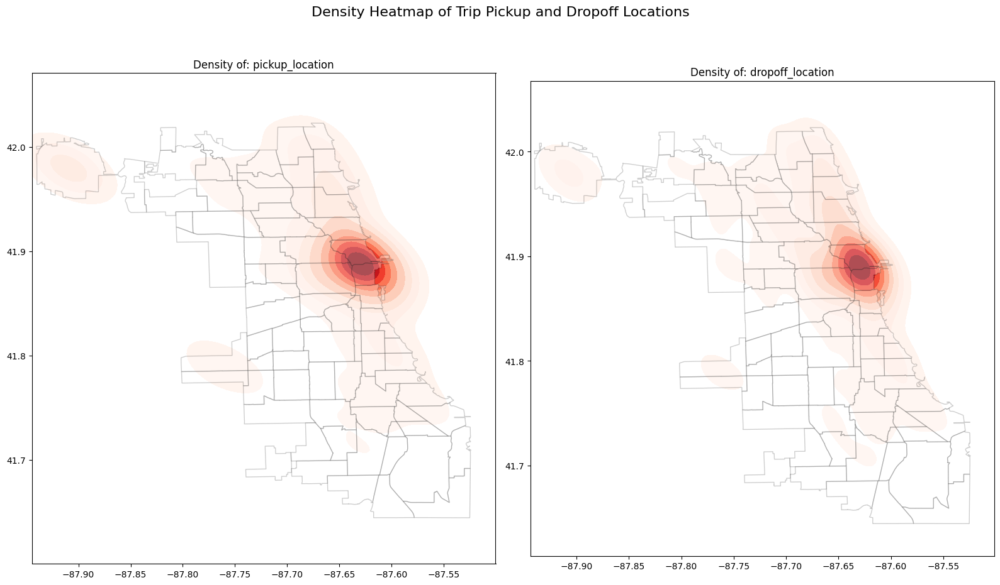

In [45]:
fig, ax = plt.subplots(1,2, figsize=(16,10))

def density_heatmap(gdf, location_pov, ax_index):
    trips = gdf[[location_pov]].groupby(location_pov).size().reset_index()
    trips.columns = ['geometry', 'count']
    trips_geo = gpd.GeoDataFrame(trips, geometry = trips['geometry'])
    
    trips_geo['centroid'] = trips_geo.geometry.centroid
    centroids = np.array(list(zip(trips_geo.centroid.x, trips_geo.centroid.y)))
    weights = trips_geo['count'].values # grouping and aggregating on size results in the frequency in column 0
    sns.kdeplot(ax = ax[ax_index], x=centroids[:,0], y=centroids[:,1], weights=weights, cmap="Reds", fill=True, bw_adjust=0.5)
    plot_chicago_shape(ax[ax_index])
    ax[ax_index].set_title(f'Density of: {location_pov}')

density_heatmap(gdf, 'pickup_location', 0)
density_heatmap(gdf, 'dropoff_location', 1)

fig.suptitle('Density Heatmap of Trip Pickup and Dropoff Locations', fontsize=16)
plt.tight_layout()
plt.show()

On average pickup and dropoff density appears to be similar, with relatively more pickups happening in the community area north west. There is one area with extremely high density of trips starting and ending. 

To easier spot the differences between different areas lets use a Chloropath map with the different h3 hexabins resolutions.

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/2429974705.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


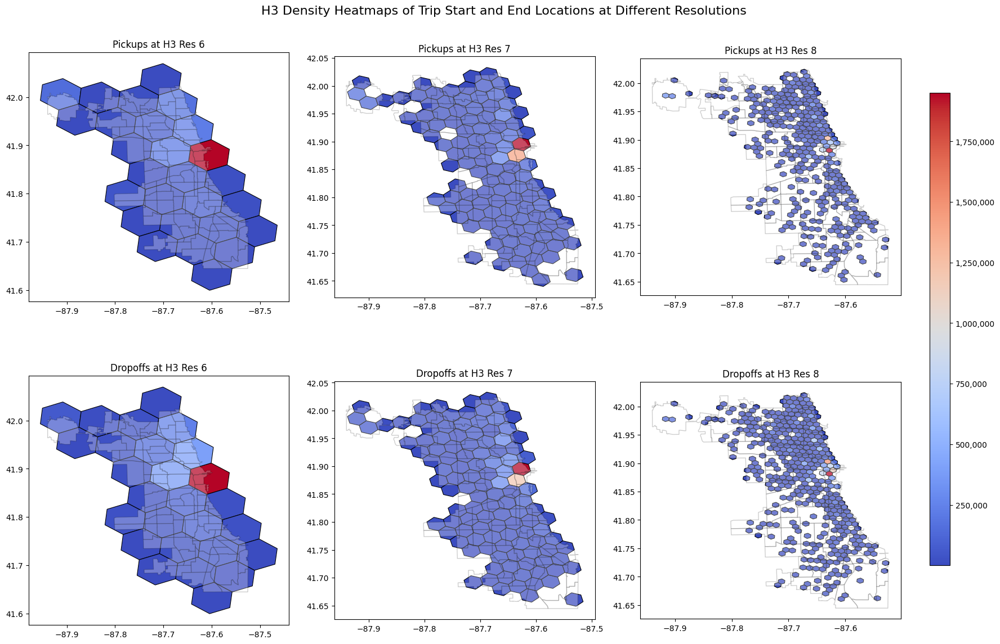

In [46]:

# Function to convert H3 hex addresses to shapely Polygon objects
def h3_to_polygon(h):
    boundary = h3.h3_to_geo_boundary(h=h, geo_json=True)
    return Polygon(boundary)

# Function to plot H3 hexagons for a given resolution
def plot_h3_density(gdf, hex_col, resolution, ax, cmap='coolwarm', title=''):
    hex_counts = gdf[hex_col].value_counts().reset_index()
    hex_counts.columns = ['hex', 'count']
    hex_counts['geometry'] = hex_counts['hex'].apply(h3_to_polygon)
    hex_gdf = gpd.GeoDataFrame(hex_counts, geometry='geometry')
    
    hex_gdf = hex_gdf.set_crs('EPSG:4326')
    norm = Normalize(vmin=hex_gdf['count'].min(), vmax=hex_gdf['count'].max())
    hex_gdf.plot(column='count', cmap=cmap, linewidth=0.8, ax=ax, edgecolor='k', alpha=1, norm=norm)
    
    plot_chicago_shape(ax)
    ax.set_title(title)
    
    return norm, hex_gdf
    
    
fig, ax = plt.subplots(2, 3, figsize=(18, 12))

norm6, pickup_gdf6 = plot_h3_density(gdf, 'h3_res_6_start', 6, ax[0, 0], title='Pickups at H3 Res 6')
norm6_end, dropoff_gdf6 = plot_h3_density(gdf, 'h3_res_6_end', 6, ax[1, 0], title='Dropoffs at H3 Res 6')

norm7, pickup_gdf7 = plot_h3_density(gdf, 'h3_res_7_start', 7, ax[0, 1], title='Pickups at H3 Res 7')
norm7_end, dropoff_gdf7 = plot_h3_density(gdf, 'h3_res_7_end', 7, ax[1, 1], title='Dropoffs at H3 Res 7')

norm8, pickup_gdf8 = plot_h3_density(gdf, 'h3_res_8_start', 8, ax[0, 2], title='Pickups at H3 Res 8')
norm8_end, dropoff_gdf8 = plot_h3_density(gdf, 'h3_res_8_end', 8, ax[1, 2], title='Dropoffs at H3 Res 8')

# Add colorbars
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
sm = ScalarMappable(cmap='coolwarm', norm=Normalize(vmin=min(norm6.vmin, norm7.vmin, norm8.vmin, norm6_end.vmin, norm7_end.vmin, norm8_end.vmin), vmax=max(norm6.vmax, norm7.vmax, norm8.vmax, norm6_end.vmax, norm7_end.vmax, norm8_end.vmax)))
sm._A = []
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x):,}'))

fig.suptitle('H3 Density Heatmaps of Trip Start and End Locations at Different Resolutions', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


One tiny hexagon (even in resolution 8), makes up most of the pickup and dropoff location. It can therefore be concluded that the traffic os very condensed to the Middle East of Chicago.

In the h3 vizualization it is way harder to spot any differences in pickup and dropoff location. Therefore lets create a explicitly encoded graph that shows the differences by hexagon

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/2808952165.py:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


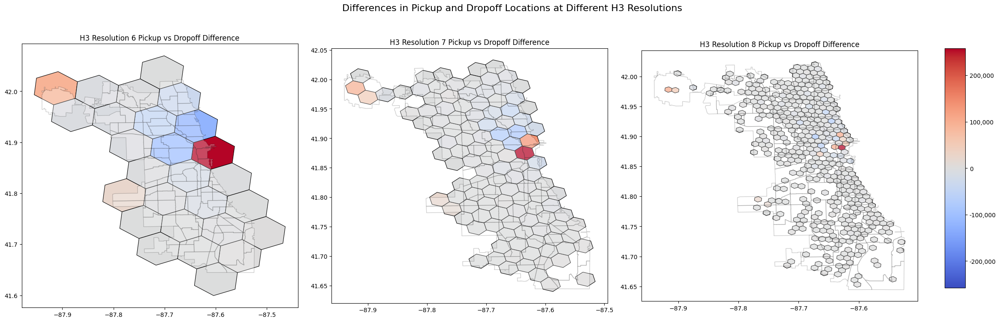

In [47]:
# Function to plot the difference in pickups and dropoffs
def plot_difference(gdf, res, ax, cmap='coolwarm'):
    pickup_col = f'h3_res_{res}_start'
    dropoff_col = f'h3_res_{res}_end'
    
    pickup_counts = gdf[pickup_col].value_counts().reset_index()
    dropoff_counts = gdf[dropoff_col].value_counts().reset_index()
    
    pickup_counts.columns = ['hex', 'pickup_count']
    dropoff_counts.columns = ['hex', 'dropoff_count']
    
    diff_counts = pd.merge(pickup_counts, dropoff_counts, on='hex', how='outer').fillna(0)
    diff_counts['difference'] = diff_counts['pickup_count'] - diff_counts['dropoff_count']
    diff_counts['geometry'] = diff_counts['hex'].apply(h3_to_polygon)
    
    diff_gdf = gpd.GeoDataFrame(diff_counts, geometry='geometry')
    diff_gdf = diff_gdf.set_crs('EPSG:4326')
    
    max_diff = max(abs(diff_gdf['difference'].min()), abs(diff_gdf['difference'].max()))
    norm = Normalize(vmin=-max_diff, vmax=max_diff)
    
    diff_gdf.plot(column='difference', cmap=cmap, linewidth=0.8, ax=ax, edgecolor='k', alpha=1, norm=norm)
    
    plot_chicago_shape(ax)
    ax.set_title(f'H3 Resolution {res} Pickup vs Dropoff Difference')
    
    return norm

fig, ax = plt.subplots(1, 3, figsize=(24, 8))

norm6 = plot_difference(gdf, 6, ax[0])
norm7 = plot_difference(gdf, 7, ax[1])
norm8 = plot_difference(gdf, 8, ax[2])

# Add colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
sm = ScalarMappable(cmap='coolwarm', norm=Normalize(vmin=-max(abs(norm6.vmin), abs(norm7.vmin), abs(norm8.vmin)), vmax=max(abs(norm6.vmax), abs(norm7.vmax), abs(norm8.vmax))))
sm._A = []
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x):,}'))

fig.suptitle('Differences in Pickup and Dropoff Locations at Different H3 Resolutions', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

There are more pickups happening in the middle east of chicago (most red hexagon). This can be overserved in all hexagon reolutions. Interestingly around this red area there are blue areas, which can be especially good observed in resolution 6 and 7. This shows that more people are getting dropped off there, probably from the red area. This is an interesting behaviour, as it shows one way traffic, the other way different transportations have to be used. The reason for this behaviour is hard to conclude.

Also in North West the pickup rate is higher than the dropoffs.

## Taxi Companies spatial coverage

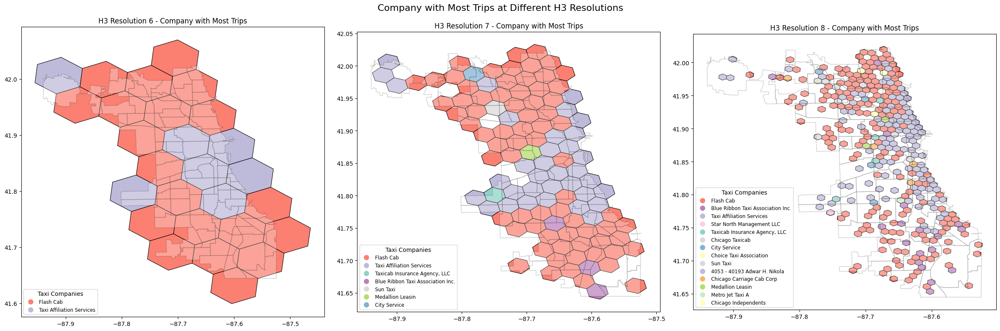

In [48]:
def plot_company_with_most_trips(gdf, res, ax, company_to_color):
    pickup_col = f'h3_res_{res}_start'
    
    # Group by hexagon and company, and count the number of trips
    company_trip_counts = gdf.groupby([pickup_col, 'company']).size().reset_index(name='trip_count')
    
    # Determine the company with the maximum trips for each hexagon
    max_company_trip_counts = company_trip_counts.loc[company_trip_counts.groupby(pickup_col)['trip_count'].idxmax()]
    
    # Map colors to companies
    max_company_trip_counts['color'] = max_company_trip_counts['company'].map(company_to_color)
    max_company_trip_counts['geometry'] = max_company_trip_counts[pickup_col].apply(h3_to_polygon)
    
    # Create a GeoDataFrame
    company_gdf = gpd.GeoDataFrame(max_company_trip_counts, geometry='geometry')
    company_gdf = company_gdf.set_crs('EPSG:4326')
    
    # Plot hexagons colored by the company with the most trips
    company_gdf.plot(color=max_company_trip_counts['color'], linewidth=0.8, ax=ax, edgecolor='k', alpha=1)
    
    # Add Chicago shape for reference (assumed to be defined elsewhere)
    plot_chicago_shape(ax)
    ax.set_title(f'H3 Resolution {res} - Company with Most Trips')
    
    # Create a legend only for companies in the current plot
    relevant_companies = max_company_trip_counts['company'].unique()
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=company,
                          markersize=10, markerfacecolor=company_to_color[company]) 
               for company in relevant_companies]
    
    ax.legend(handles=handles, title='Taxi Companies', loc='lower left', bbox_to_anchor=(0, 0),
              fontsize='small', title_fontsize='medium', framealpha=0.8)

# Prepare the data
unique_companies = gdf['company'].unique()
num_companies = len(unique_companies)

# Use a larger qualitative color map
colors = sns.color_palette('Set3', num_companies)  # 'Set3' gives a good range of distinct colors

company_to_color = {company: colors[i] for i, company in enumerate(unique_companies)}

# Plotting setup
fig, ax = plt.subplots(1, 3, figsize=(24, 8))  # Adjusted figure size as needed

# Plot for each resolution
plot_company_with_most_trips(gdf, 6, ax[0], company_to_color)
plot_company_with_most_trips(gdf, 7, ax[1], company_to_color)
plot_company_with_most_trips(gdf, 8, ax[2], company_to_color)

fig.suptitle('Company with Most Trips at Different H3 Resolutions', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 1])  # Adjust layout to fit legends
plt.show()

Flash Cab and Taxi Affiliation Services, the two largest companies, cover most of the Chicago area. While Taxi Affiliation Services is more active in the central and northwest regions, its dominance is closely correlated with the number of taxi trips taken. The less trafficked areas in the north and south are dominated by Flash Cab.

## Chloropleth Map of Length, Duration and Speed

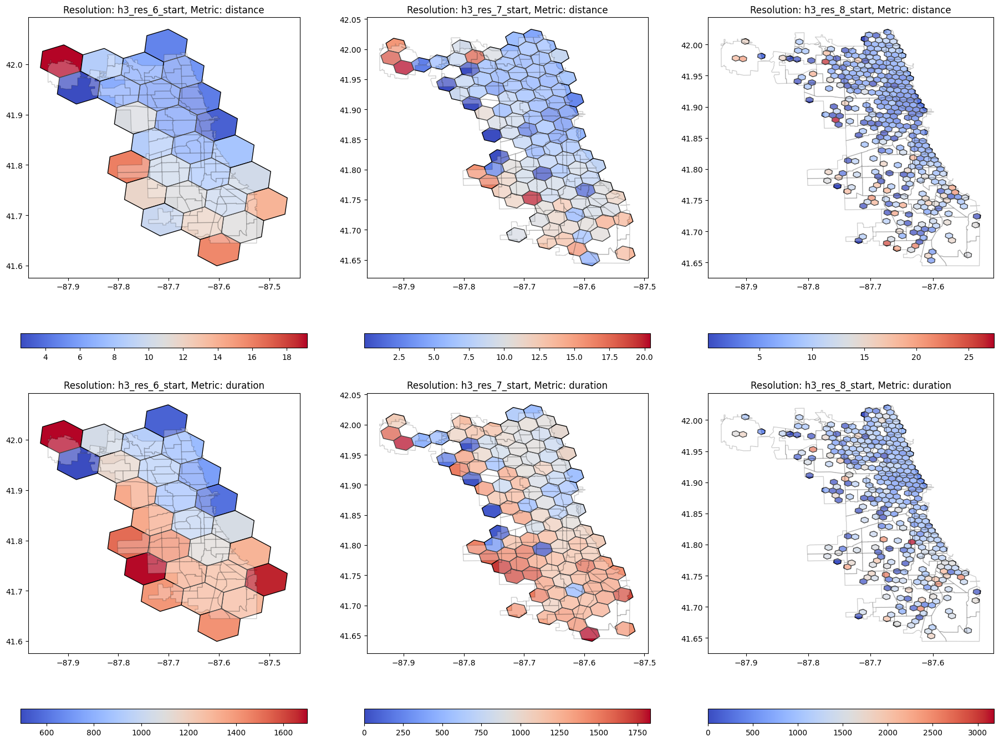

In [49]:
resolutions = ['h3_res_6_start', 'h3_res_7_start', 'h3_res_8_start']
metrics = ['distance', 'duration']

nrows = len(metrics)
ncols = len(resolutions)
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 6 + 2))
axes = axes.flatten()

def chloropleth_means_map(gdf, resolution, metric):
    chloro_mean = pd.DataFrame()
    chloro_mean = gdf[[resolution, metric]].groupby(resolution).mean().reset_index()
    chloro_mean.columns = ['id', 'mean']
    chloro_mean['geometry'] = chloro_mean.apply(lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry=chloro_mean['geometry'], crs='EPSG:4326')
    return chloro_mean_geo

ax_index = 0
for metric in metrics:
    for resolution in resolutions:
        ax = axes[ax_index]
        chloropleth_means_map(gdf_idle, resolution, metric).plot(ax=ax, column='mean', cmap='coolwarm', edgecolor='k', legend=True, legend_kwds={'orientation': 'horizontal'})
        plot_chicago_shape(ax)
        ax.set_title(f'Resolution: {resolution}, Metric: {metric}')
        ax_index += 1

plt.tight_layout()
plt.subplots_adjust(hspace=0.01, wspace=0.2) 
plt.show()

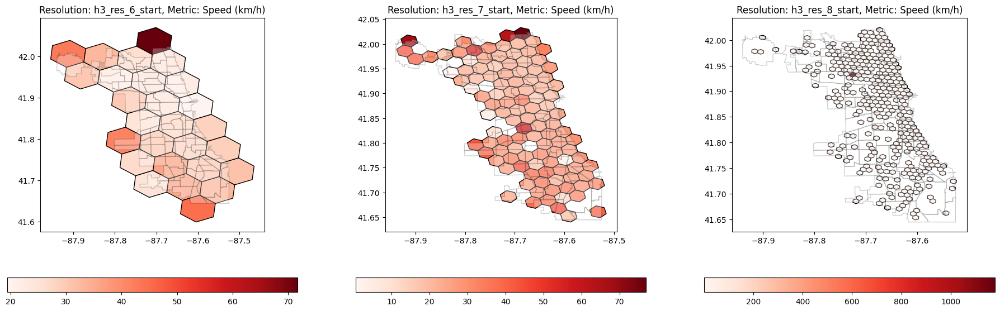

In [50]:
resolutions = ['h3_res_6_start', 'h3_res_7_start', 'h3_res_8_start']
distance_col = 'distance'  # Distance in km
duration_col = 'duration'  # Duration in seconds

fig, axes = plt.subplots(1, len(resolutions), figsize=(len(resolutions) * 6, 6))
if len(resolutions) == 1:
    axes = [axes]

def chloropleth_means_map(gdf, resolution):
    chloro_mean = pd.DataFrame()
    gdf_plot = gdf[gdf[duration_col] > 0].copy()  # Filter out rows with zero duration
    gdf_plot['speed'] = (gdf_plot[distance_col] / gdf_plot[duration_col]) * 3600  # Convert speed to km/h
    chloro_mean = gdf_plot[[resolution, 'speed']].groupby(resolution).mean().reset_index()
    chloro_mean.columns = ['id', 'mean_speed']
    chloro_mean['geometry'] = chloro_mean.apply(lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry=chloro_mean['geometry'], crs='EPSG:4326')
    return chloro_mean_geo

for ax, resolution in zip(axes, resolutions):
    chloropleth_means_map(gdf_idle, resolution).plot(ax=ax, column='mean_speed', cmap='Reds', edgecolor='k', legend=True, legend_kwds={'orientation': 'horizontal'})
    plot_chicago_shape(ax)  # Assuming this function is defined elsewhere
    ax.set_title(f'Resolution: {resolution}, Metric: Speed (km/h)')

plt.tight_layout()
plt.subplots_adjust(hspace=0.01, wspace=0.2)
plt.show()

there seem to be an outlier in resolution 8, therefore lets limit all colourscales from 0 to 75.

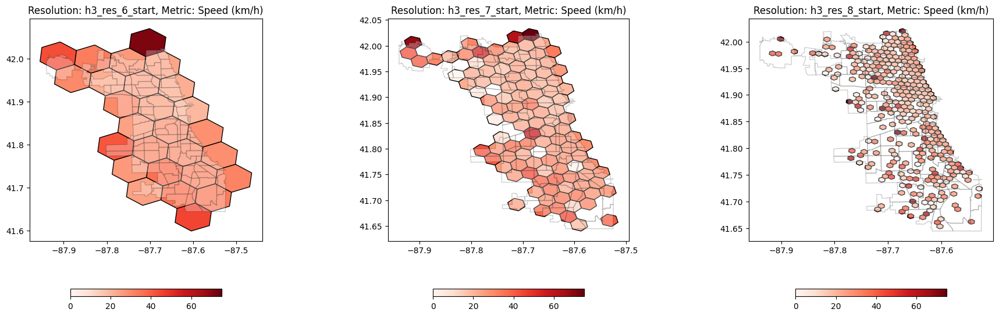

In [51]:
fig, axes = plt.subplots(1, len(resolutions), figsize=(len(resolutions) * 6, 6))

for ax, resolution in zip(axes, resolutions):
    chloro_mean_geo = chloropleth_means_map(gdf_idle, resolution)
    chloro_mean_geo.plot(
        ax=ax, 
        column='mean_speed', 
        cmap='Reds', 
        edgecolor='k', 
        legend=True, 
        legend_kwds={'orientation': 'horizontal', 'shrink': 0.5},
        vmin=0, 
        vmax=75
    )
    plot_chicago_shape(ax)  # Assuming this function is defined elsewhere
    ax.set_title(f'Resolution: {resolution}, Metric: Speed (km/h)')

plt.tight_layout()
plt.subplots_adjust(hspace=0.01, wspace=0.2)
plt.show()

It can be ovsereved that at the boarders of Chicago the average speed is a lot higher than in the areas with more trips. That could lead to the concludion that there are less traffic jams and traffic in general.

## Chloropleth Map of Total fare, tipps and extras

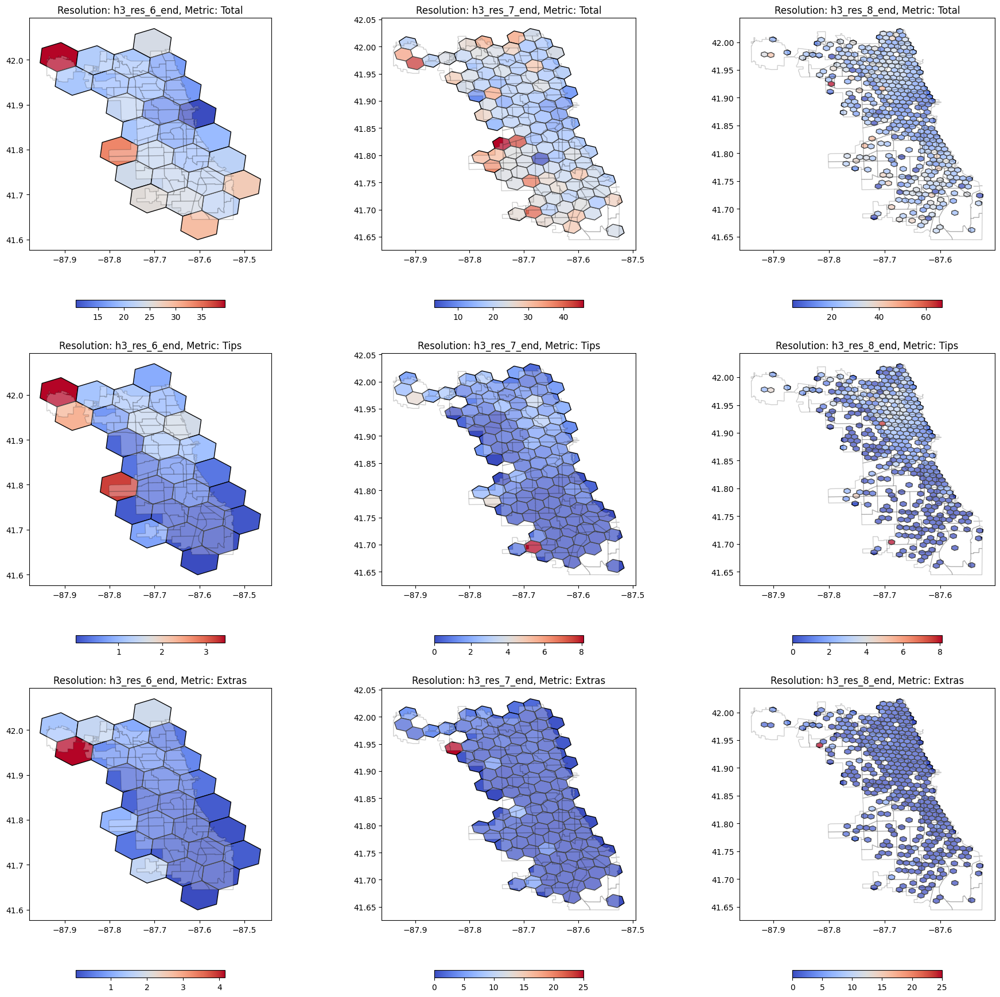

In [52]:
# Define the resolutions and metrics
resolutions = ['h3_res_6_end', 'h3_res_7_end', 'h3_res_8_end']
metrics = ['total', 'tips', 'extras']

# Adjust the plot setup for new metrics
fig, axes = plt.subplots(len(metrics), len(resolutions), figsize=(len(resolutions) * 6, len(metrics) * 6))
axes = np.array(axes).reshape(len(metrics), len(resolutions))

def chloropleth_means_map_metric(gdf, resolution, metric):
    chloro_mean = pd.DataFrame()
    chloro_mean = gdf[[resolution, metric]].groupby(resolution).mean().reset_index()
    chloro_mean.columns = ['id', 'mean']
    chloro_mean['geometry'] = chloro_mean.apply(lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry=chloro_mean['geometry'], crs='EPSG:4326')
    return chloro_mean_geo

for i, metric in enumerate(metrics):
    for j, resolution in enumerate(resolutions):
        ax = axes[i, j]
        chloro_mean_geo = chloropleth_means_map_metric(gdf_idle, resolution, metric)
        chloro_mean_geo.plot(
            ax=ax, 
            column='mean', 
            cmap='coolwarm', 
            edgecolor='k', 
            legend=True, 
            legend_kwds={'orientation': 'horizontal', 'shrink': 0.5}
        )
        plot_chicago_shape(ax)  # Assuming this function is defined elsewhere
        ax.set_title(f'Resolution: {resolution}, Metric: {metric.title()}')

plt.tight_layout()
plt.subplots_adjust(hspace=0.01, wspace=0.2)
plt.show()

The total fare seems similary distributed to the trip length which makes sense. Extras are only high in one specific hexagon on the north west, which seems to be an outlier. The rest of the extras seems to be farely low overall hexagons. Tips are higher on the on a few hexagon on the west, although also here it seems that it might be caused through some outlieres. In general the area on the Midnorth seems to be overall the most generous over a more broad area, which can especially good observed in the resolution 8.

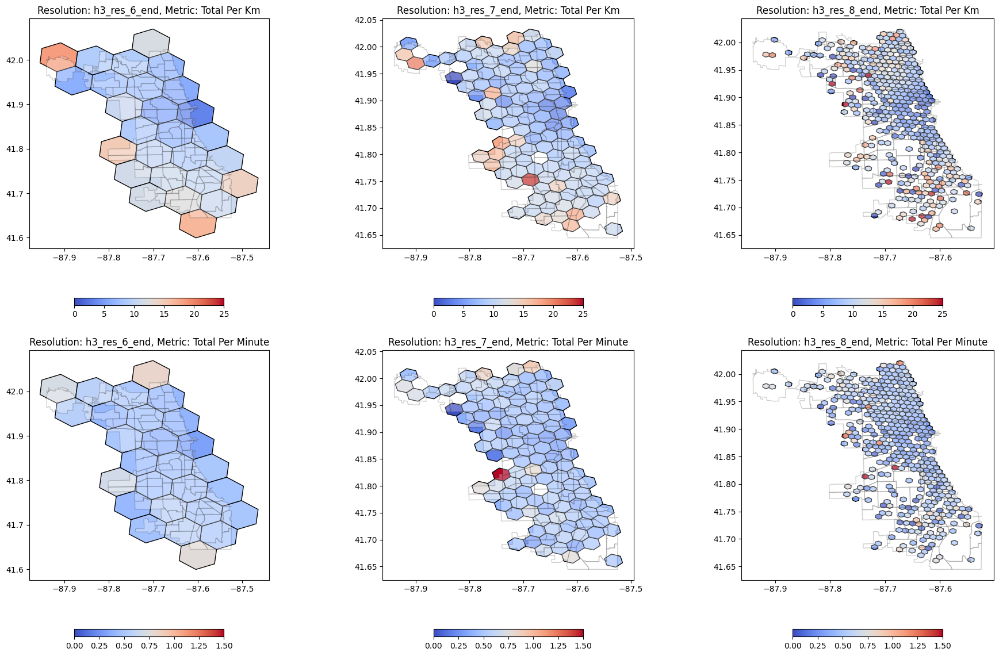

In [53]:

# Define the resolutions and metrics
resolutions = ['h3_res_6_end', 'h3_res_7_end', 'h3_res_8_end']
metrics = ['total_per_km', 'total_per_minute']

# Adjust the plot setup for new metrics
fig, axes = plt.subplots(len(metrics), len(resolutions), figsize=(len(resolutions) * 6, len(metrics) * 6))
if len(metrics) == 1:
    axes = [axes]
axes = np.array(axes).reshape(len(metrics), len(resolutions))

def calculate_metrics(gdf, resolution):
    chloro_mean = pd.DataFrame()
    gdf_plot = gdf[gdf['duration'] > 0].copy()  # Filter out rows with zero duration
    gdf_plot['total_per_km'] = gdf_plot['distance']
    gdf_plot['total_per_minute'] = (gdf_plot['distance'] / gdf_plot['duration']) * 60  # Convert to per minute
    
    metrics_df = pd.DataFrame()
    for metric in metrics:
        metric_mean = gdf_plot[[resolution, metric]].groupby(resolution).mean().reset_index()
        metric_mean.columns = ['id', metric]
        metric_mean['geometry'] = metric_mean.apply(lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)
        if metrics_df.empty:
            metrics_df = metric_mean[['id', 'geometry', metric]]
        else:
            metrics_df = metrics_df.merge(metric_mean[['id', metric]], on='id')
    
    metrics_df_geo = gpd.GeoDataFrame(metrics_df, geometry=metrics_df['geometry'], crs='EPSG:4326')
    
    return metrics_df_geo

for i, metric in enumerate(metrics):
    for j, resolution in enumerate(resolutions):
        ax = axes[i, j]
        metrics_geo = calculate_metrics(gdf_idle, resolution)
        metrics_geo.plot(
            ax=ax, 
            column=metric, 
            cmap='coolwarm', 
            edgecolor='k', 
            legend=True, 
            legend_kwds={'orientation': 'horizontal', 'shrink': 0.5},
            vmin=0, 
            vmax=25 if metric == 'total_per_km' else 1.5  # Adjust limits based on the metric
        )
        plot_chicago_shape(ax)  # Assuming this function is defined elsewhere
        ax.set_title(f'Resolution: {resolution}, Metric: {metric.replace("_", " ").title()}')

plt.tight_layout()
plt.subplots_adjust(hspace=0.01, wspace=0.2)
plt.show()

## Chloropath map for Idle Time

Based on the analysis we did before we limit the idle time to the range of 0 to 75.

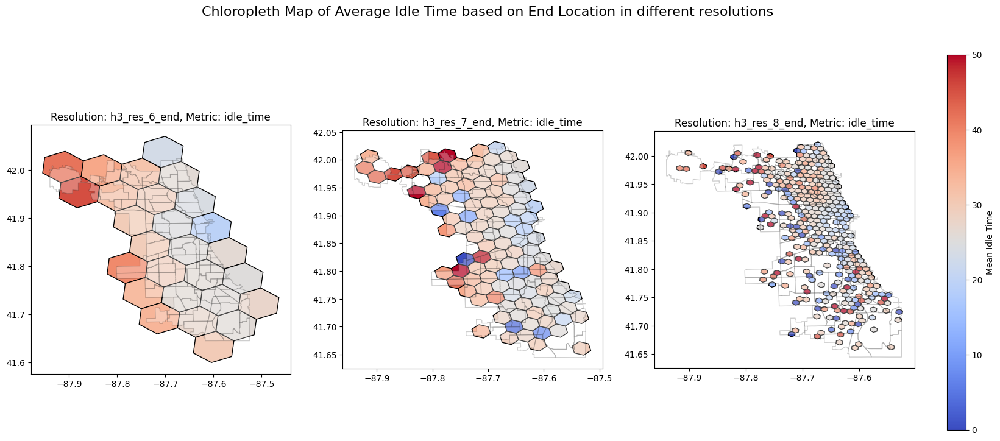

In [54]:
# Define the resolutions and metrics
resolutions = ['h3_res_6_end', 'h3_res_7_end', 'h3_res_8_end']
metrics = ['idle_time']

nrows = 1
ncols = len(resolutions)
fig, axes = plt.subplots(nrows, ncols, figsize=(20, 8))
axes = axes.flatten()

def chloropleth_means_map(gdf, resolution, metric):
    chloro_mean = pd.DataFrame()
    chloro_mean = gdf[[resolution, metric]].groupby(resolution).mean().reset_index()
    chloro_mean.columns = ['id', 'mean']
    chloro_mean['geometry'] = chloro_mean.apply(lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry=chloro_mean['geometry'], crs='EPSG:4326')
    return chloro_mean_geo

norm = mcolors.Normalize(vmin=0, vmax=50)
cmap = matplotlib.colormaps['coolwarm']

ax_index = 0
# To keep track of all the plots for colorbar
im = None

for resolution in resolutions:
    for metric in metrics:
        ax = axes[ax_index]
        im = chloropleth_means_map(gdf_idle[(gdf_idle['idle_time'] <= 75) & 
                                             (gdf_idle['idle_time'] >= 0)], 
                                   resolution, metric).plot(ax=ax, 
                                                            column='mean', 
                                                            cmap=cmap, 
                                                            norm=norm, 
                                                            edgecolor='k', 
                                                            legend=False)
        plot_chicago_shape(ax)
        ax.set_title(f'Resolution: {resolution}, Metric: {metric}')
        ax_index += 1

# Create a colorbar based on the last plot
cbar = fig.colorbar(im.collections[0], ax=axes, orientation='vertical', fraction=0.03, pad=0.04)
cbar.set_label('Mean Idle Time')

fig.suptitle('Chloropleth Map of Average Idle Time based on End Location in different resolutions', fontsize=16)
plt.subplots_adjust(right=0.85)
plt.subplots_adjust(top=0.85)
plt.show()

# Spatial-Temporal Analytics

For spatial-temporal analytics, let's combine the choropleth map with the time buckets we defined earlier to spot differences at various times of the day (later we willa also go into quarterly comparison over the year). Let's start with a resolution of 6, as using higher resolutions might make it difficult to draw conclusions due to excessive detail. If we need to make more detailed assumptions, we can dive into higher resolutions as needed.

## Trip Count over the Day

Let's first check the distirbution of trips over the courseof the day of whole Chicago, afterwards, lets zoom into the specific areas of interest.

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/2433694651.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


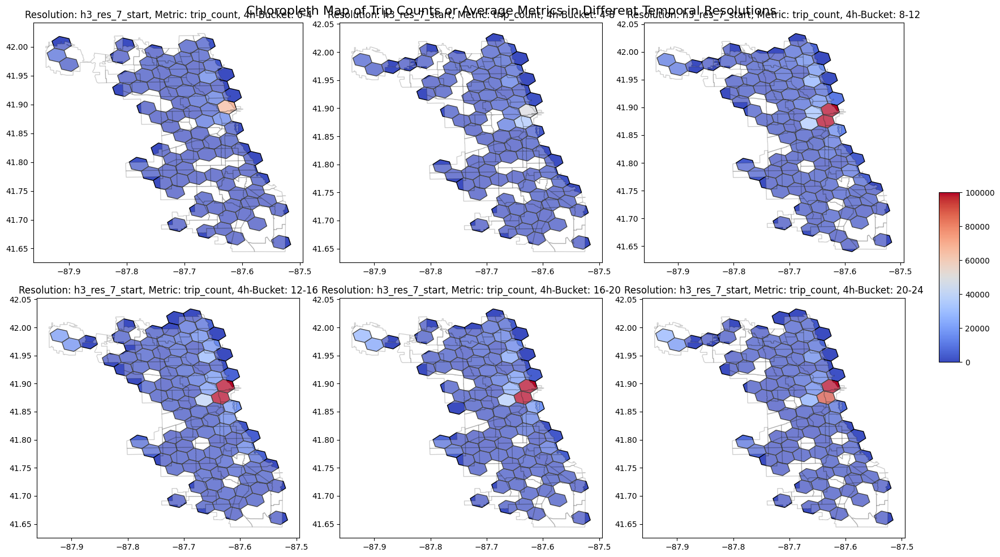

In [55]:
# Define the resolution and metric
resolution = 'h3_res_7_start'
metric = 'trip_count'  # Assuming this is the metric you want to calculate
h_buckets = ['0-4', '4-8', '8-12', '12-16', '16-20', '20-24']

nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 100000  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

def chloropleth_means_map(gdf, resolution, metric):
    # Create a copy of the dataframe to avoid the SettingWithCopyWarning
    gdf_copy = gdf.copy()

    # Define new calculated metrics
    if metric == "speed":
        # Calculate speed in km/h
        gdf_copy.loc[:, 'calculated_metric'] = (gdf_copy['distance'] / gdf_copy['duration']) * 3600
    elif metric == "total/minute":
        # Calculate total per minute
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / (gdf_copy['duration'] / 60)
    elif metric == "total/km":
        # Calculate total per km
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / gdf_copy['distance']
    elif metric == "trip_count":
        # Calculate trip count as the count of trip_id
        chloro_count = pd.DataFrame()
        chloro_count = gdf_copy.groupby(resolution)['trip_id'].count().reset_index()
        chloro_count.columns = ['id', 'count']
        chloro_count['geometry'] = chloro_count.apply(
            lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1
        )
        chloro_count_geo = gpd.GeoDataFrame(chloro_count, geometry=chloro_count['geometry'], crs='EPSG:4326')
        return chloro_count_geo
    else:
        # Use the given metric as is if no calculation is needed
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy[metric]
        
    chloro_mean = pd.DataFrame()
    chloro_mean = gdf_copy[[resolution, 'calculated_metric']].groupby(resolution).mean().reset_index()
    chloro_mean.columns = ['id', 'mean']
    chloro_mean['geometry'] = chloro_mean.apply(
        lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1
    )

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry=chloro_mean['geometry'], crs='EPSG:4326')
    return chloro_mean_geo    # Create a copy of the dataframe to avoid the SettingWithCopyWarning
    
for h_bucket in h_buckets:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm
    
    # Modify the plot to check for trip_count and handle it accordingly
    if metric == "trip_count":
        gdf_bucket = gdf_idle[gdf_idle['4h_bucket'] == h_bucket]
        geo_df = chloropleth_means_map(gdf_bucket, resolution, metric)
        im = geo_df.plot(ax=ax, column='count', cmap=cmap, norm=norm, edgecolor='k', legend=False)
    else:
        im = chloropleth_means_map(gdf_idle[gdf_idle['4h_bucket'] == h_bucket], resolution, metric).plot(
            ax=ax, column='mean', cmap=cmap, norm=norm, edgecolor='k', legend=False
        )

    plot_chicago_shape(ax)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, 4h-Bucket: {h_bucket}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Count' if metric == "trip_count" else 'Mean Value')

fig.suptitle('Chloropleth Map of Trip Counts or Average Metrics in Different Temporal Resolutions', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()

We can observe what we have already oservered before. The central east areas are experiencing the highest trip counts over the course of the whole day, with less traffic during the night. The other areas are not coming close to these values, therefore it is hard to compare.

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/328162661.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


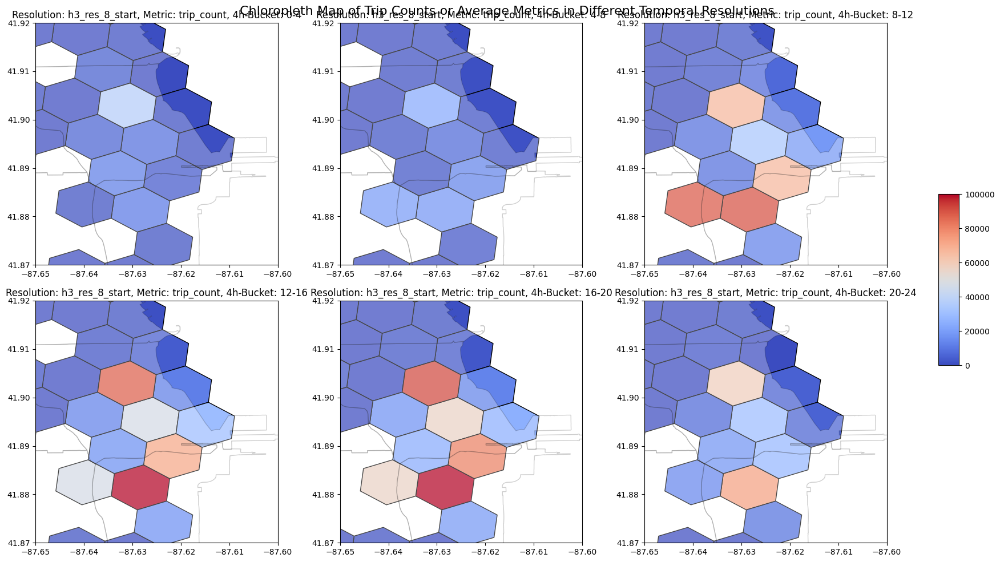

In [56]:
# Define the resolution and metric
resolution = 'h3_res_8_start'
metric = 'trip_count'  # Assuming this is the metric you want to calculate
h_buckets = ['0-4', '4-8', '8-12', '12-16', '16-20', '20-24']

nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 100000  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

for h_bucket in h_buckets:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm
    
    # Modify the plot to check for trip_count and handle it accordingly
    if metric == "trip_count":
        gdf_bucket = gdf_idle[gdf_idle['4h_bucket'] == h_bucket]
        geo_df = chloropleth_means_map(gdf_bucket, resolution, metric)
        im = geo_df.plot(ax=ax, column='count', cmap=cmap, norm=norm, edgecolor='k', legend=False)
    else:
        im = chloropleth_means_map(gdf_idle[gdf_idle['4h_bucket'] == h_bucket], resolution, metric).plot(
            ax=ax, column='mean', cmap=cmap, norm=norm, edgecolor='k', legend=False
        )

    plot_chicago_shape(ax)
    ax.set_xlim(-87.65, -87.60)
    ax.set_ylim(41.87, 41.92)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, 4h-Bucket: {h_bucket}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Count' if metric == "trip_count" else 'Mean Value')

fig.suptitle('Chloropleth Map of Trip Counts or Average Metrics in Different Temporal Resolutions', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()

When we only check the Chicago downtown area we can spot small differences over the day. Over the night is is more distributed ehile especially in the afternon from 12-20 the same areas are shwoing the hoghest trips.

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/435681942.py:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


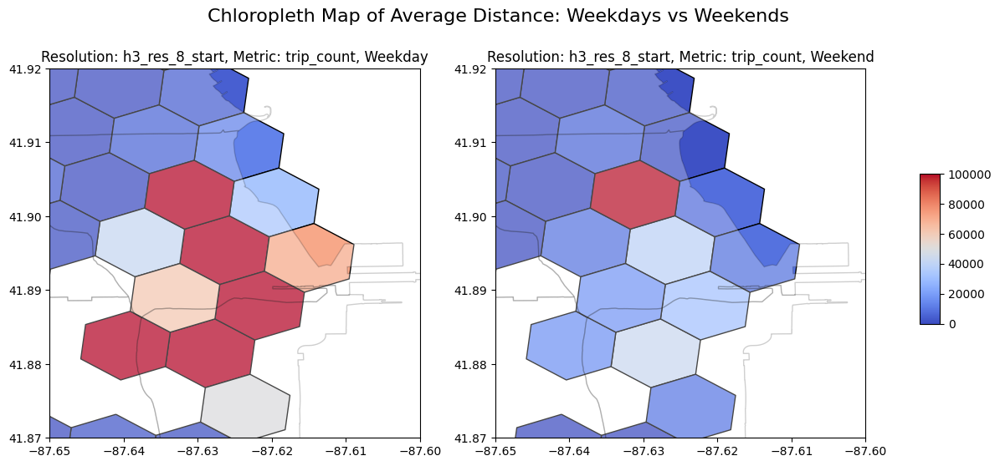

In [57]:
# Define the resolution and metric
resolution = 'h3_res_8_start'
metric = 'trip_count'
week_categories = ['Weekday', 'Weekend']

# Prepare the figure layout
nrows = 1
ncols = 2
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 100000  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

for week_category in week_categories:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm

    # Filter data based on weekend or weekday
    is_weekend = True if week_category == 'Weekend' else False
    filtered_data = gdf_idle[gdf_idle['is_weekend'] == is_weekend]

    # Plot the chloropleth map
    im = chloropleth_means_map(filtered_data, resolution, metric).plot(
        ax=ax, column='count', cmap=cmap, norm=norm, edgecolor='k', legend=False)
    
    plot_chicago_shape(ax)
    ax.set_xlim(-87.65, -87.60)
    ax.set_ylim(41.87, 41.92)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, {week_category}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Mean Value')

fig.suptitle('Chloropleth Map of Average Distance: Weekdays vs Weekends', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()

There is an interesting pattern in the comparison between weekday and weekend traffic. On weekdays, the highlighted areas show the highest traffic levels. However, on weekends, only one hexagon exhibits very high traffic. This difference could be attributed to work-related taxi trips on weekdays, which tend to go to different areas compared to weekends, when taxi trips are more likely to be for leisure activities.

## Chloropath map of Distance and Duration over the course of the day

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/2833450278.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


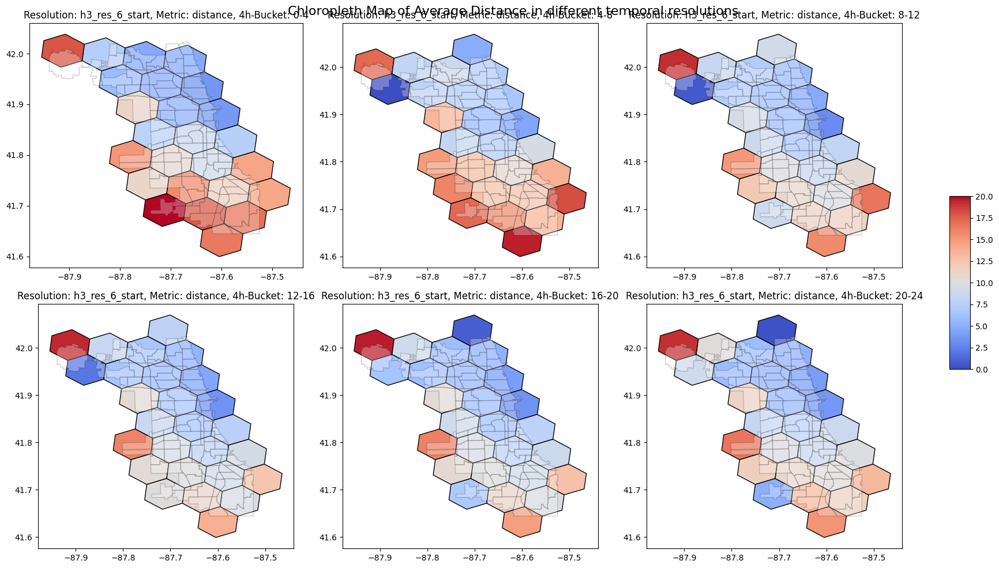

In [58]:
# Define the resolution and metric
resolution = 'h3_res_6_start'
metric = 'distance'
h_buckets = ['0-4', '4-8', '8-12', '12-16', '16-20', '20-24']

nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 20  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

def chloropleth_means_map(gdf, resolution, metric):
    
    # Create a copy of the dataframe to avoid the SettingWithCopyWarning
    gdf_copy = gdf.copy()

    # Define new calculated metrics
    if metric == "speed":
        # Calculate speed in km/h
        gdf_copy.loc[:, 'calculated_metric'] = (gdf_copy['distance'] / gdf_copy['duration']) * 3600
    elif metric == "total/minute":
        # Calculate total per minute
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / (gdf_copy['duration'] / 60)
    elif metric == "total/km":
        # Calculate total per km
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / gdf_copy['distance']
    else:
        # Use the given metric as is if no calculation is needed
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy[metric]
        
    chloro_mean = pd.DataFrame()
    chloro_mean = gdf[[resolution, metric]].groupby(resolution).mean().reset_index()
    chloro_mean.columns = ['id', 'mean']
    chloro_mean['geometry'] = chloro_mean.apply(lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry=chloro_mean['geometry'], crs='EPSG:4326')
    return chloro_mean_geo

for h_bucket in h_buckets:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm
    im = chloropleth_means_map(gdf_idle[gdf_idle['4h_bucket'] == h_bucket], resolution, metric).plot(ax=ax, column='mean', cmap=cmap, norm=norm, edgecolor='k', legend=False)
    plot_chicago_shape(ax)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, 4h-Bucket: {h_bucket}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Mean Value')

fig.suptitle('Chloropleth Map of Average Distance in different temporal resolutions', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()

The greatest distances appear to be covered in the northwest from 0 to 8, slightly less than during the rest of the day. Interestingly, it is the opposite for the south, where higher distances are covered from 0 to 8. In the hotspot area of the Mideast, the distances remain quite stable throughout the day.

Spatial-Temporal Analysis comes with some challanges, especially the comparison is difficult as the areas are in the different subplots, which makes it hard to compare specific hexagons and areas. Therefore let's create a function that shows the different temporal bins in each hexagons by different sizes. This allows us better comparison for specific hexagons, which may help us on finding very volatile areas over the course of the day.

In [75]:
def chloropleth_means_map(gdf, resolution, metric):
    # Create a copy of the dataframe to avoid the SettingWithCopyWarning
    gdf_copy = gdf.copy()

    # Define new calculated metrics
    if metric == "speed":
        # Calculate speed in km/h
        gdf_copy.loc[:, 'calculated_metric'] = (gdf_copy['distance'] / gdf_copy['duration']) * 3600
    elif metric == "total/minute":
        # Calculate total per minute
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / (gdf_copy['duration'] / 60)
    elif metric == "total/km":
        # Calculate total per km
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / gdf_copy['distance']
    else:
        # Use the given metric as is if no calculation is needed
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy[metric]

    # Ensure the trip count is calculated correctly
    chloro_mean = gdf_copy[[resolution, 'calculated_metric', 'trip_id']].groupby(resolution).agg(
        mean_metric=('calculated_metric', 'mean'),
        trip_count=('trip_id', 'count')
    ).reset_index()

    chloro_mean.columns = ['id', 'mean', 'trip_count']
    chloro_mean['geometry'] = chloro_mean.apply(
        lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry='geometry', crs='EPSG:4326')
    return chloro_mean_geo

def plot_chicago_hexbin(community_area_boundaries, chicago_shape, chloropleth_means_map, gdf_idle, metric, filters, value_range, vmin, vmax, resolution, time_bins, hexbin_scales, min_trip_count, time_column='4h_bucket', label_hexagons=False):
    """
    Plot hexbin maps over Chicago with optional time-based scaling using either '4h_bucket' or 'quarter'.

    Parameters:
    - community_area_boundaries: GeoDataFrame with community boundaries
    - chicago_shape: Shape of Chicago
    - chloropleth_means_map: Function to create chloropleth means map
    - gdf_idle: GeoDataFrame with idle data
    - metric: Metric to plot
    - filters: Dictionary of filters to apply to the data
    - value_range: Range of metric values to consider
    - vmin, vmax: Min and max for colormap normalization
    - resolution: Resolution for plotting
    - time_bins: List of time bins (either quarters or 4h buckets)
    - hexbin_scales: Scaling factors for hexbin sizes
    - min_trip_count: Minimum trip count for inclusion
    - time_column: The column used for time binning ('4h_bucket' or 'quarter')
    - label_hexagons: Whether to label hexagons with IDs
    """
    def plot_chicago_shape(ax):
        community_area_boundaries.plot(ax=ax, color='white', alpha=0.2, edgecolor='k')
        gpd.GeoSeries([chicago_shape]).plot(ax=ax, color='white', alpha=0.1)

    fig, ax = plt.subplots(figsize=(20, 12))

    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    cmap = matplotlib.colormaps['coolwarm']

    hexagon_counter = 1  # Counter for hexagon labels

    # Dictionary to track unique resolution IDs
    unique_resolution_ids = set()

    for i, (time_bin, hexbin_scale) in enumerate(zip(time_bins, hexbin_scales)):
        subset = gdf_idle
        for col, value in filters.items():
            subset = subset[subset[col] == value]
        subset = subset[(subset[time_column] == time_bin) & 
                        (subset[metric] <= value_range[1]) & 
                        (subset[metric] >= value_range[0])]
        
        hexbin_plot = chloropleth_means_map(subset, resolution, metric)

        # Filter out hexbins with trip count less than min_trip_count
        hexbin_plot = hexbin_plot[hexbin_plot['trip_count'] >= min_trip_count]

        # Apply scaling
        for idx, row in hexbin_plot.iterrows():
            scaled_geometry = scale(row['geometry'], xfact=hexbin_scale, yfact=hexbin_scale, origin='centroid')
            hexbin_plot.at[idx, 'geometry'] = scaled_geometry

        hexbin_plot.plot(ax=ax, 
                         column='mean', 
                         cmap=cmap, 
                         norm=norm,
                         edgecolor='k', 
                         legend=False, 
                         alpha=1)

        # Collect unique resolution IDs and their centroids
        if label_hexagons:
            unique_resolution_ids.update(hexbin_plot['id'].unique())

    # Label unique hexagons
    if label_hexagons:
        for hex_id in unique_resolution_ids:
            # Find the centroid of the unique hexagon
            centroid = Polygon(h3.h3_to_geo_boundary(hex_id, geo_json=True)).centroid
            ax.text(centroid.x, centroid.y, f'h{hexagon_counter}', fontsize=12, ha='center', va='center', color='yellow', fontweight='bold')
            hexagon_counter += 1

    plot_chicago_shape(ax)
    ax.set_title(f'Overlayed Hexbin Map based on Start Location in Different Temporal Resolution for {metric}', fontsize=16)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')

    # Create a colorbar based on the last plot
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  
    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.03, pad=0.04)
    cbar.set_label(metric)

    # Create custom legend with artificial hexbins of different sizes
    legend_patches = [RegularPolygon((0, 0), numVertices=6, radius=hexbin_scale, 
                                     orientation=np.radians(30), facecolor='gray', edgecolor='k') 
                      for hexbin_scale in hexbin_scales]

    legend_labels = time_bins

    # Combine the legends
    legend = ax.legend(legend_patches, legend_labels, title='Time Bins', loc='lower left', bbox_to_anchor=(0.1, 0.1))
    ax.add_artist(legend)

    # Add the actual patches to the plot to make them visible in the legend
    for patch, hexbin_scale in zip(legend_patches, hexbin_scales):
        ax.add_patch(RegularPolygon((0, 0), numVertices=6, radius=hexbin_scale, orientation=np.radians(30), 
                                    facecolor='none', edgecolor='none'))

    plt.show()

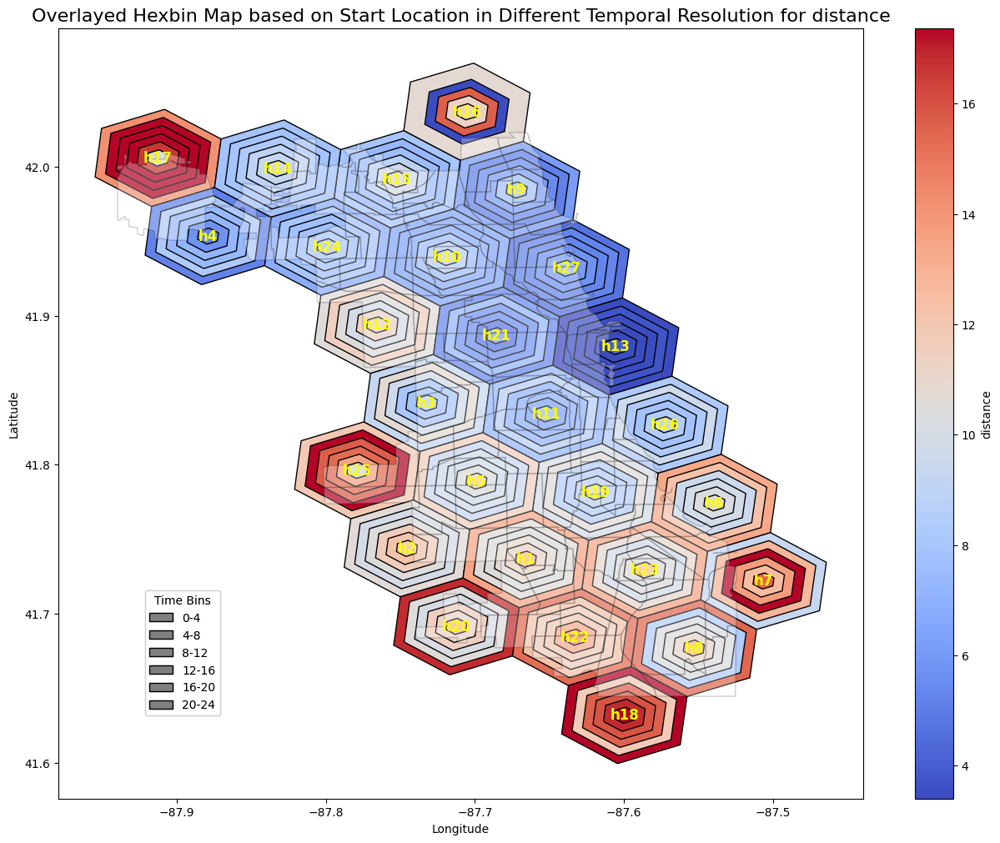

In [60]:
plot_chicago_hexbin(
    community_area_boundaries=community_area_boundaries,
    chicago_shape=chicago_shape,
    chloropleth_means_map=chloropleth_means_map,
    gdf_idle=gdf_idle,
    metric='distance',
    filters={},
    value_range=(0, 75),
    vmin=None,
    vmax=None,
    resolution='h3_res_6_end',
    time_bins=['0-4', '4-8', '8-12', '12-16', '16-20', '20-24'],
    hexbin_scales=[6/6, 5/6, 4/6, 3/6, 2/6, 1/6],
    min_trip_count= 0,
    label_hexagons=True,
    time_column='4h_bucket'  # or 'quarter'
)

The south seems to be, as expected from the previous grpahs, the most votatile part of Chicago, where the average distance is flucatuating and less high over the day, which we already saw before.

Even though the visual is good to spot differences in a hexagon over the day, it is not great for comparing different hexagons with each other, therefore still a Superposition plot should be employed. Therefore lets use this graph only when we really want to spot diferences for specific reasons.

## Chloropath map of Distance Weekday vs. Weekend

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/2082815502.py:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


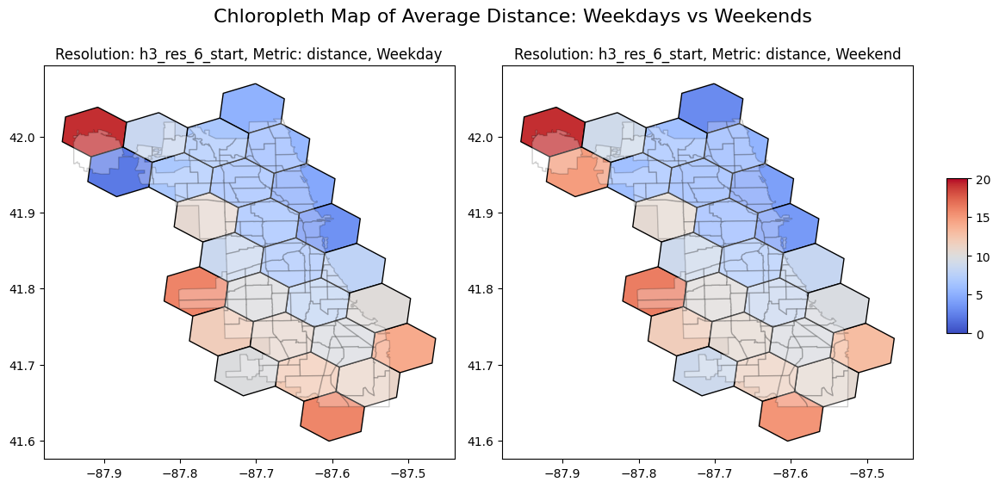

In [61]:
# Define the resolution and metric
resolution = 'h3_res_6_start'
metric = 'distance'
week_categories = ['Weekday', 'Weekend']

# Prepare the figure layout
nrows = 1
ncols = 2
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 20  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

for week_category in week_categories:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm

    # Filter data based on weekend or weekday
    is_weekend = True if week_category == 'Weekend' else False
    filtered_data = gdf_idle[gdf_idle['is_weekend'] == is_weekend]

    # Plot the chloropleth map
    im = chloropleth_means_map(filtered_data, resolution, metric).plot(
        ax=ax, column='mean', cmap=cmap, norm=norm, edgecolor='k', legend=False)
    
    plot_chicago_shape(ax)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, {week_category}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Mean Value')

fig.suptitle('Chloropleth Map of Average Distance: Weekdays vs Weekends', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()


we didn't find any major spatial-temporal differences, which means taxi usage patterns are pretty consistent between weedays and weekend. This suggests that ditance driven remains steady throughout the day. There are no significant variations in how people use taxis on weekends.

Let's now compare the speed over different regions over the course the day to find areas that have different traffic conditions over the day.

## Chloropath map of Speed over the course of the day

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/741068206.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


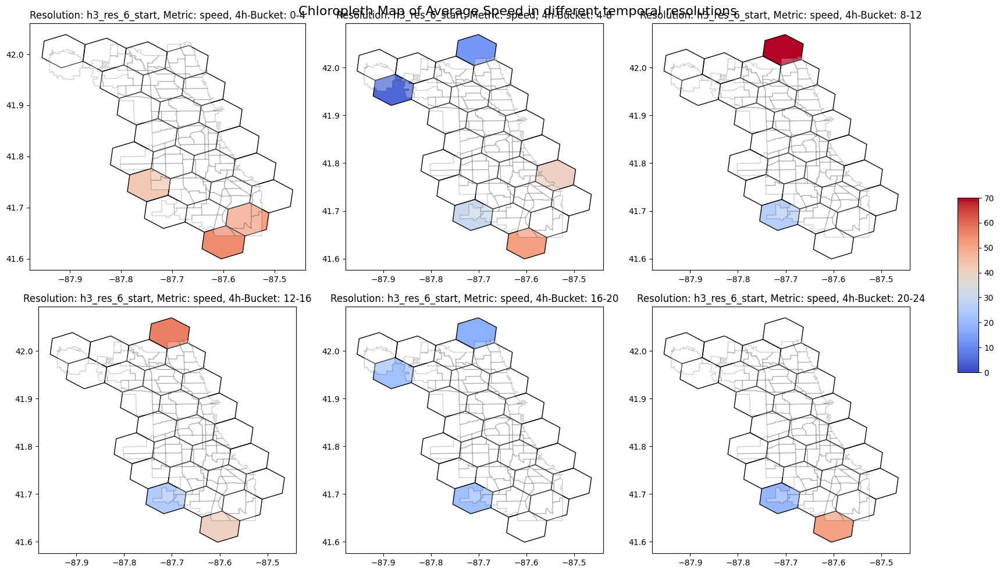

In [76]:
# Define the resolution and metric
resolution = 'h3_res_6_start'
metric = 'speed'
h_buckets = ['0-4', '4-8', '8-12', '12-16', '16-20', '20-24']

nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 70  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

for h_bucket in h_buckets:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm
    im = chloropleth_means_map(gdf_idle[gdf_idle['4h_bucket'] == h_bucket], resolution, metric).plot(ax=ax, column='mean', cmap=cmap, norm=norm, edgecolor='k', legend=False)
    plot_chicago_shape(ax)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, 4h-Bucket: {h_bucket}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Mean Value')

fig.suptitle('Chloropleth Map of Average Speed in different temporal resolutions', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()

We can spot that there are in general higher speeds in the south from 0 to 4, as probably in the night there is way less traffic.

To have a more specfic look at Chicago downtown (Mideast), lets break it down into a smaller resolution so we can spot different traffic behaviours over the day for the most trafficed area of Chicago.

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/1557275674.py:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


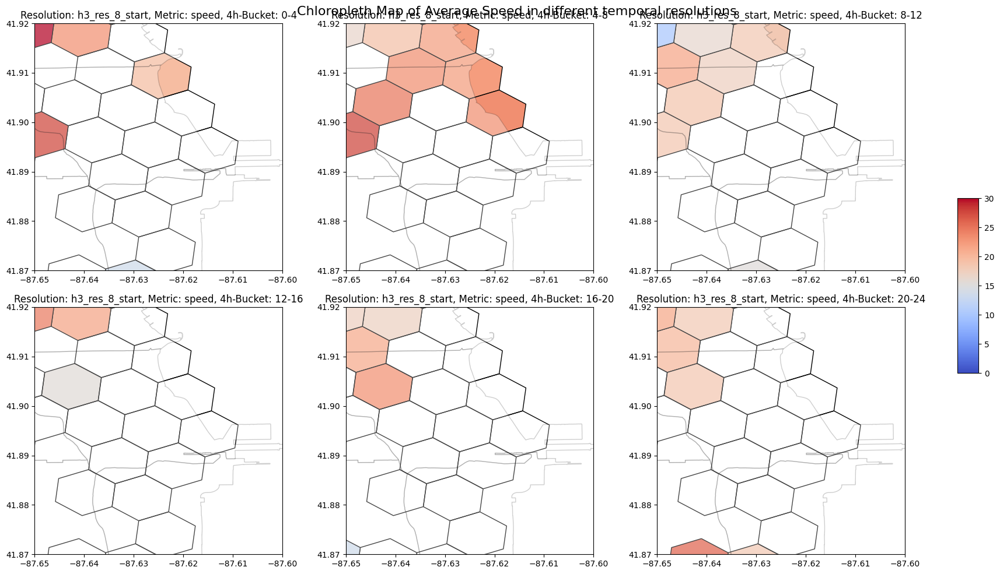

In [63]:
# Define the resolution and metric
resolution = 'h3_res_8_start'
metric = 'speed'
h_buckets = ['0-4', '4-8', '8-12', '12-16', '16-20', '20-24']

nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 30  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

for h_bucket in h_buckets:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm
    im = chloropleth_means_map(gdf_idle[gdf_idle['4h_bucket'] == h_bucket], resolution, metric).plot(
        ax=ax,
        column='mean',
        cmap=cmap,
        norm=norm,
        edgecolor='k',
        legend=False
    )
    plot_chicago_shape(ax)
    ax.set_xlim(-87.65, -87.60)
    ax.set_ylim(41.87, 41.92)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, 4h-Bucket: {h_bucket}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Mean Value')

fig.suptitle('Chloropleth Map of Average Speed in different temporal resolutions', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()

Now we can spot some differences in the Chicago Downtown areas. During the evening and the night the average speed seems the highest. for the commuting times at 8-12 and 16-20 it is visible that the south of Chicago downtown is experiencing lower average traffic, which indicates traffic jams for this time of the day for this specific area.

## Chloropath map of Average Total Fare over the course of the day

Let's check how the total fare changes over the course of the day for the different regions. Lets limit the scale to 40, otherwise we would onl y highlight outlier hexagons with low traffic amounts.

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/2889052643.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


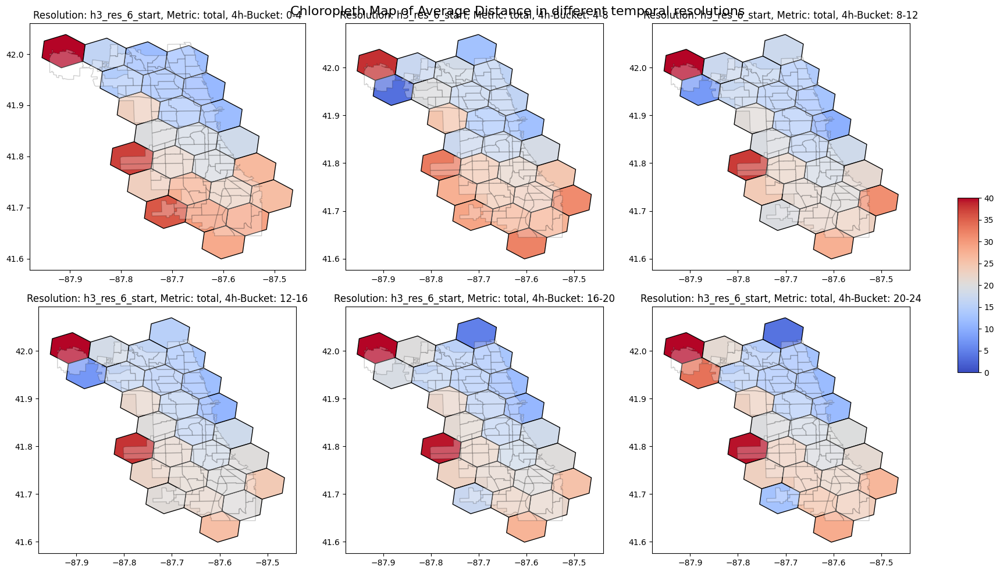

In [64]:
# Define the resolution and metric
resolution = 'h3_res_6_start'
metric = 'total'
h_buckets = ['0-4', '4-8', '8-12', '12-16', '16-20', '20-24']

nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 40  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

for h_bucket in h_buckets:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm
    im = chloropleth_means_map(gdf_idle[gdf_idle['4h_bucket'] == h_bucket], resolution, metric).plot(ax=ax, column='mean', cmap=cmap, norm=norm, edgecolor='k', legend=False)
    plot_chicago_shape(ax)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, 4h-Bucket: {h_bucket}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Mean Value')

fig.suptitle('Chloropleth Map of Average Distance in different temporal resolutions', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()

The fare distribution over the course of the day shows major similarities to the distance patterns. This suggests that the total fare is mainly bound to the distance driven.

## Chloropath map of fare/minute and fare/km over the course of the day

To not show outliers, we limit the view to the range of 0 to 2.5 total fare / mintue.

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/1773668385.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


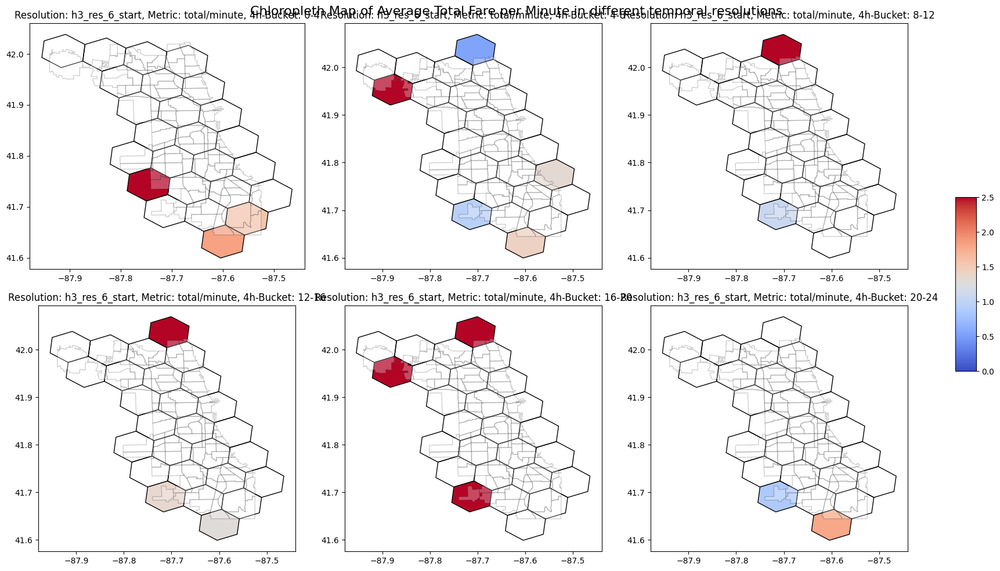

In [65]:
# Define the resolution and metric
resolution = 'h3_res_6_start'
metric = 'total/minute'
h_buckets = ['0-4', '4-8', '8-12', '12-16', '16-20', '20-24']

nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 2.5  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

def chloropleth_means_map(gdf, resolution):
    # Create a copy of the dataframe to avoid the SettingWithCopyWarning
    gdf_copy = gdf.copy()

    # Calculate the 'calculated_metric'
    gdf_copy['calculated_metric'] = gdf_copy['total'] / (gdf_copy['duration'] / 60)

    chloro_mean = gdf_copy[[resolution, 'calculated_metric']].groupby(resolution).mean().reset_index()
    chloro_mean.columns = ['id', 'mean']
    chloro_mean['geometry'] = chloro_mean.apply(lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry=chloro_mean['geometry'], crs='EPSG:4326')
    return chloro_mean_geo

for h_bucket in h_buckets:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm
    im = chloropleth_means_map(gdf_idle[gdf_idle['4h_bucket'] == h_bucket], resolution).plot(ax=ax, column='mean', cmap=cmap, norm=norm, edgecolor='k', legend=False)
    plot_chicago_shape(ax)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, 4h-Bucket: {h_bucket}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Mean Value')

fig.suptitle('Chloropleth Map of Average Total Fare per Minute in different temporal resolutions', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/1001638884.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


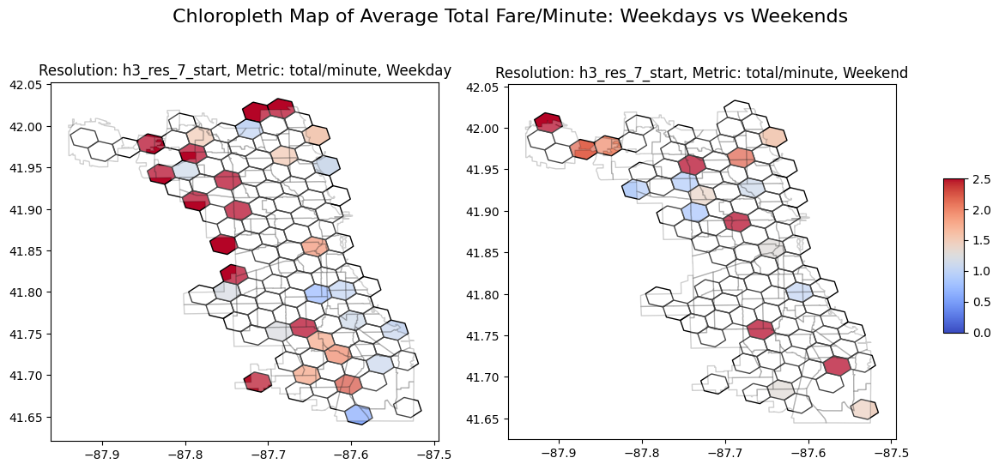

In [66]:
# Define the resolution and metric
resolution = 'h3_res_7_start'
metric = 'total/minute'
week_categories = ['Weekday', 'Weekend']

# Prepare the figure layout
nrows = 1
ncols = 2
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 2.5  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

def chloropleth_means_map(gdf, resolution, metric):
    # Create a copy of the dataframe to avoid the SettingWithCopyWarning
    gdf_copy = gdf.copy()

    # Define new calculated metrics
    if metric == "speed":
        # Calculate speed in km/h
        gdf_copy.loc[:, 'calculated_metric'] = (gdf_copy['distance'] / gdf_copy['duration']) * 3600
    elif metric == "total/minute":
        # Calculate total per minute
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / (gdf_copy['duration'] / 60)
    elif metric == "total/km":
        # Calculate total per km
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / gdf_copy['distance']
    else:
        # Use the given metric as is if no calculation is needed
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy[metric]

    # Ensure the trip count is calculated correctly
    chloro_mean = gdf_copy[[resolution, 'calculated_metric', 'trip_id']].groupby(resolution).agg(
        mean_metric=('calculated_metric', 'mean'),
        trip_count=('trip_id', 'count')
    ).reset_index()

    chloro_mean.columns = ['id', 'mean', 'trip_count']
    chloro_mean['geometry'] = chloro_mean.apply(
        lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry='geometry', crs='EPSG:4326')
    return chloro_mean_geo

for week_category in week_categories:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm

    # Filter data based on weekend or weekday
    is_weekend = True if week_category == 'Weekend' else False
    filtered_data = gdf_idle[gdf_idle['is_weekend'] == is_weekend]

    # Plot the chloropleth map
    im = chloropleth_means_map(filtered_data, resolution, metric).plot(
        ax=ax, column='mean', cmap=cmap, norm=norm, edgecolor='k', legend=False)
    
    plot_chicago_shape(ax)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, {week_category}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Mean Value')

fig.suptitle('Chloropleth Map of Average Total Fare/Minute: Weekdays vs Weekends', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()


/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/2258846619.py:46: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


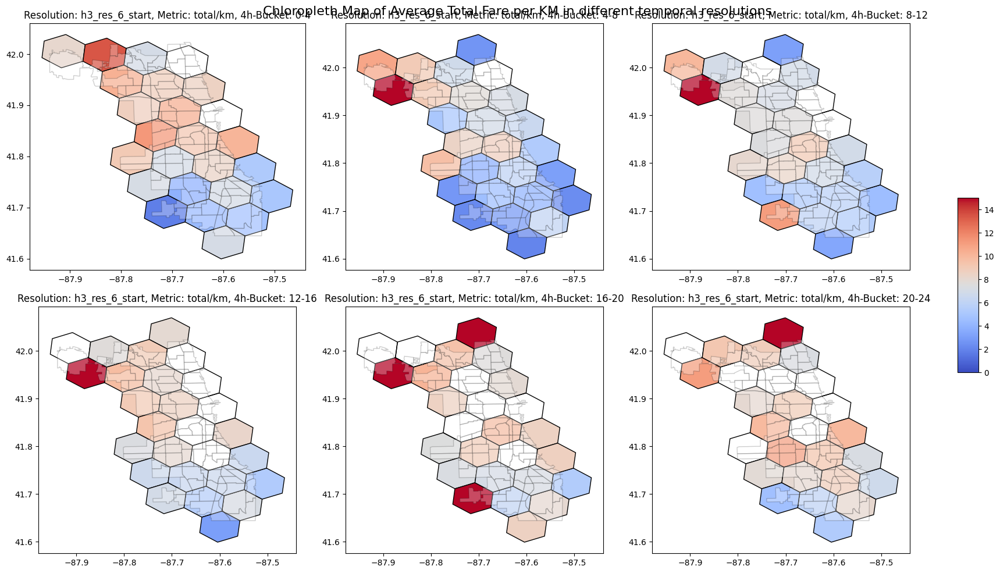

In [67]:
# Define the resolution and metric
resolution = 'h3_res_6_start'
metric = 'total/km'
h_buckets = ['0-4', '4-8', '8-12', '12-16', '16-20', '20-24']

nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 15  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

def chloropleth_means_map(gdf, resolution):
    # Create a copy of the dataframe to avoid the SettingWithCopyWarning
    gdf_copy = gdf.copy()

    # Calculate the 'calculated_metric'
    gdf_copy['calculated_metric'] = gdf_copy['total'] / (gdf_copy['distance'])

    chloro_mean = gdf_copy[[resolution, 'calculated_metric']].groupby(resolution).mean().reset_index()
    chloro_mean.columns = ['id', 'mean']
    chloro_mean['geometry'] = chloro_mean.apply(lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry=chloro_mean['geometry'], crs='EPSG:4326')
    return chloro_mean_geo

for h_bucket in h_buckets:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm
    im = chloropleth_means_map(gdf_idle[gdf_idle['4h_bucket'] == h_bucket], resolution).plot(ax=ax, column='mean', cmap=cmap, norm=norm, edgecolor='k', legend=False)
    plot_chicago_shape(ax)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, 4h-Bucket: {h_bucket}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Mean Value')

fig.suptitle('Chloropleth Map of Average Total Fare per KM in different temporal resolutions', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()

Between midnight and 4 AM, the northwest consistently shows the highest fares per kilometer. Throughout the day, the northwest consistently maintains higher fare rates, while the southern areas generally exhibit lower fares, reflecting localized demand and commuting behaviors. The south has overall the lowest fare per km, especially during the morning rush hour 4-8 AM. In the afternoon from 16-20 there is a spike in total fare per km in the south.

/var/folders/40/5ykxrd1x7ysbm3kps5_9k_yc0000gn/T/ipykernel_4742/267014541.py:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


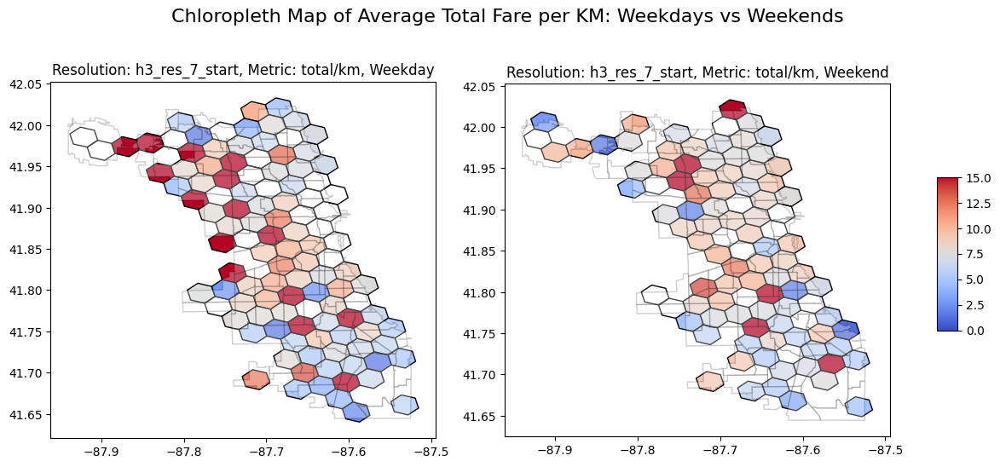

In [68]:
# Define the resolution and metric
resolution = 'h3_res_7_start'
metric = 'total/km'
week_categories = ['Weekday', 'Weekend']

# Prepare the figure layout
nrows = 1
ncols = 2
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 4 + 2))
axes = axes.flatten()

ax_index = 0
max_value = 15  # Set maximum value for normalization

# To keep track of all the plots for colorbar
im = None

def chloropleth_means_map(gdf, resolution, metric):
    # Create a copy of the dataframe to avoid the SettingWithCopyWarning
    gdf_copy = gdf.copy()

    # Define new calculated metrics
    if metric == "speed":
        # Calculate speed in km/h
        gdf_copy.loc[:, 'calculated_metric'] = (gdf_copy['distance'] / gdf_copy['duration']) * 3600
    elif metric == "total/minute":
        # Calculate total per minute
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / (gdf_copy['duration'] / 60)
    elif metric == "total/km":
        # Calculate total per km
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / gdf_copy['distance']
    elif metric == "trip_count":
    # Calculate total trip count
        total_trip_count = gdf_copy['trip_id'].count()
        gdf_copy.loc[:, 'calculated_metric'] = total_trip_count
    else:
        # Use the given metric as is if no calculation is needed
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy[metric]

    # Ensure the trip count is calculated correctly
    chloro_mean = gdf_copy[[resolution, 'calculated_metric', 'trip_id']].groupby(resolution).agg(
        mean_metric=('calculated_metric', 'mean'),
        trip_count=('trip_id', 'count')
    ).reset_index()

    chloro_mean.columns = ['id', 'mean', 'trip_count']
    chloro_mean['geometry'] = chloro_mean.apply(
        lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry='geometry', crs='EPSG:4326')
    return chloro_mean_geo

for week_category in week_categories:
    ax = axes[ax_index]
    norm = mcolors.Normalize(vmin=0, vmax=max_value)
    cmap = plt.cm.coolwarm

    # Filter data based on weekend or weekday
    is_weekend = True if week_category == 'Weekend' else False
    filtered_data = gdf_idle[gdf_idle['is_weekend'] == is_weekend]

    # Plot the chloropleth map
    im = chloropleth_means_map(filtered_data, resolution, metric).plot(
        ax=ax, column='mean', cmap=cmap, norm=norm, edgecolor='k', legend=False)
    
    plot_chicago_shape(ax)
    ax.set_title(f'Resolution: {resolution}, Metric: {metric}, {week_category}')
    ax_index += 1

# Create colorbar for the last plot
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.3])
fig.colorbar(im.collections[0], cax=cbar_ax, orientation='vertical', norm=norm, cmap=cmap)
cbar_ax.set_label('Mean Value')

fig.suptitle('Chloropleth Map of Average Total Fare per KM: Weekdays vs Weekends', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()


## Chloropath map of Idle Time over the course of the day in 4h buckets

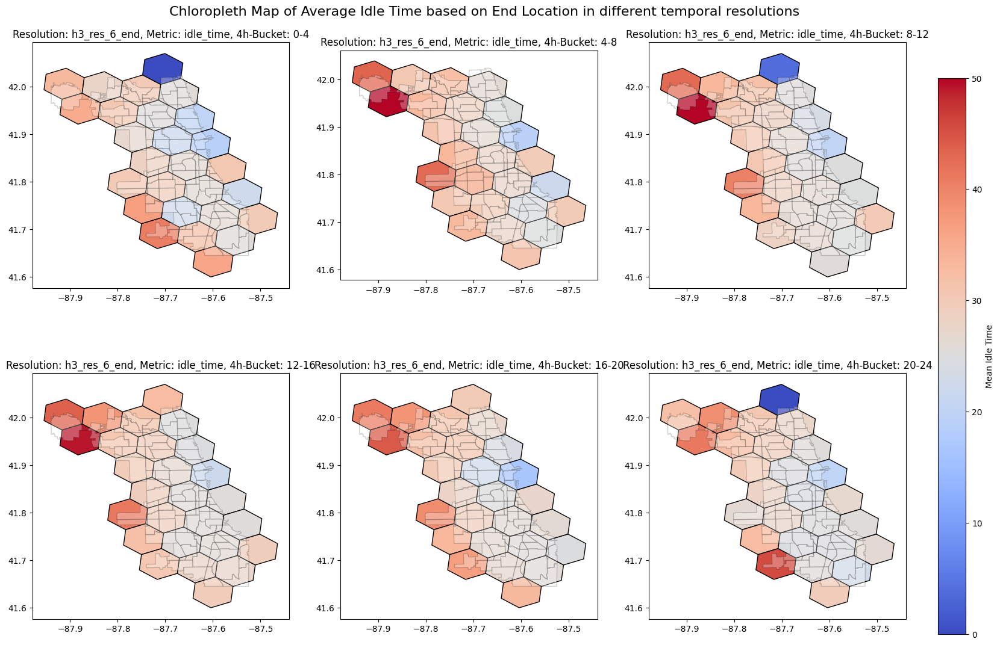

In [69]:
resolution = 'h3_res_6_end'
metrics = ['idle_time']
h_buckets = ['0-4', '4-8', '8-12', '12-16', '16-20', '20-24']

nrows = len(h_buckets)
ncols = len(metrics)
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

ax_index = 0

norm = mcolors.Normalize(vmin=0, vmax=50)
cmap = matplotlib.colormaps['coolwarm']

# To keep track of all the plots for colorbar
im = None

for metric in metrics:
    for h_bucket in h_buckets:
        ax = axes[ax_index]
        im = chloropleth_means_map(gdf_idle[(gdf_idle['4h_bucket'] == h_bucket) & 
                                             (gdf_idle['idle_time'] <= 75) & 
                                             (gdf_idle['idle_time'] >= 0)], 
                                   resolution, metric).plot(ax=ax, 
                                                            column='mean', 
                                                            cmap=cmap, 
                                                            norm=norm, 
                                                            edgecolor='k', 
                                                            legend=False)
        plot_chicago_shape(ax)
        ax.set_title(f'Resolution: {resolution}, Metric: {metric}, 4h-Bucket: {h_bucket}')
        ax_index += 1

# Create a colorbar based on the last plot
cbar = fig.colorbar(im.collections[0], ax=axes, orientation='vertical', fraction=0.03, pad=0.04)
cbar.set_label('Mean Idle Time')

fig.suptitle('Chloropleth Map of Average Idle Time based on End Location in different temporal resolutions', fontsize=16)
plt.subplots_adjust(right=0.85)
plt.subplots_adjust(top=0.95)
plt.show()

To eliminate outliers that cause a big difference in the graph we use minimum number of trips per hexbin in order to show only relevent trips andso that we can do a good comparison.

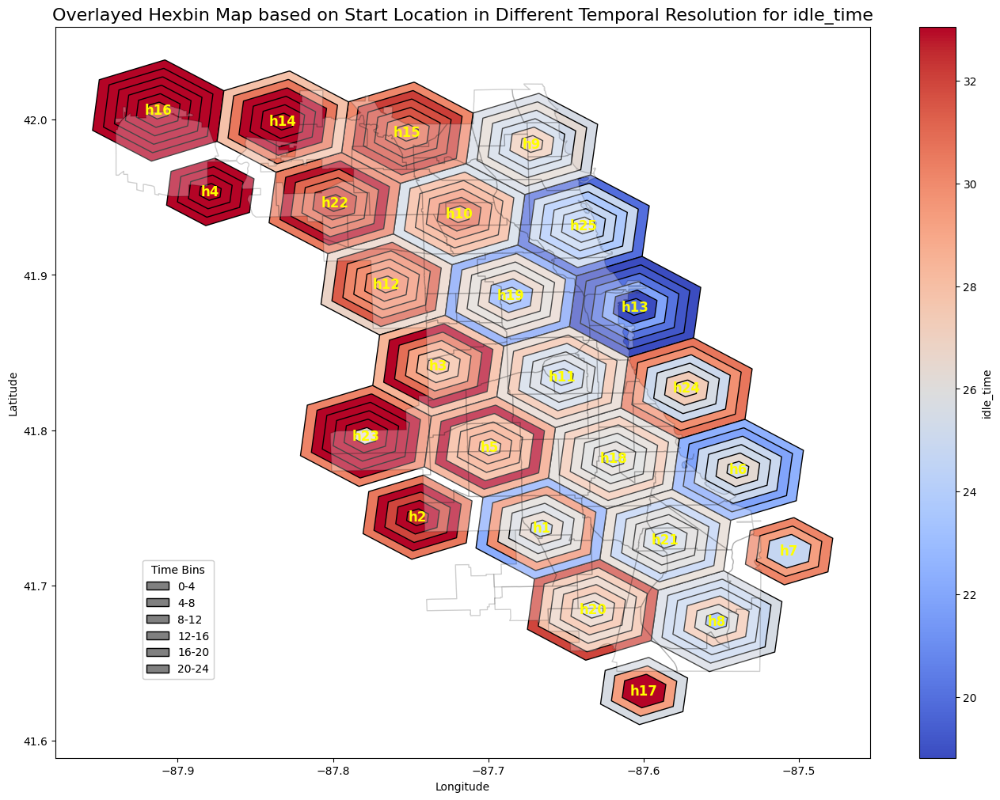

In [70]:
plot_chicago_hexbin(
    community_area_boundaries=community_area_boundaries,
    chicago_shape=chicago_shape,
    chloropleth_means_map=chloropleth_means_map,
    gdf_idle=gdf_idle,
    metric='idle_time',
    filters={},
    value_range=(0, 75),
    vmin=None,
    vmax=None,
    resolution='h3_res_6_end',
    time_bins=['0-4', '4-8', '8-12', '12-16', '16-20', '20-24'],
    hexbin_scales=[6/6, 5/6, 4/6, 3/6, 2/6, 1/6],
    min_trip_count= 100,
    label_hexagons=True,
    time_column='4h_bucket'  # or 'quarter'
)

With all hexagons filtered out below 100 trips to eliminate outliers, we can spot that most of the hexagons have quite stable Idle Time over the day. As already seen before this is higher for the west and lower for the east. However some hexagos have quite heterogenous colour over the course of the day, which means that the idle time is differing in these regions based on the time of day. These areas especially towards the south (h8, h13, h21) and partly east (h3, h25) indicate this behaviour. This lets use conclude that there might be a supply-demand imbalance leading to this volatile behaviour.

Lets review the areas with the highest trip counts by setting the minimum trip count filter to 5000:

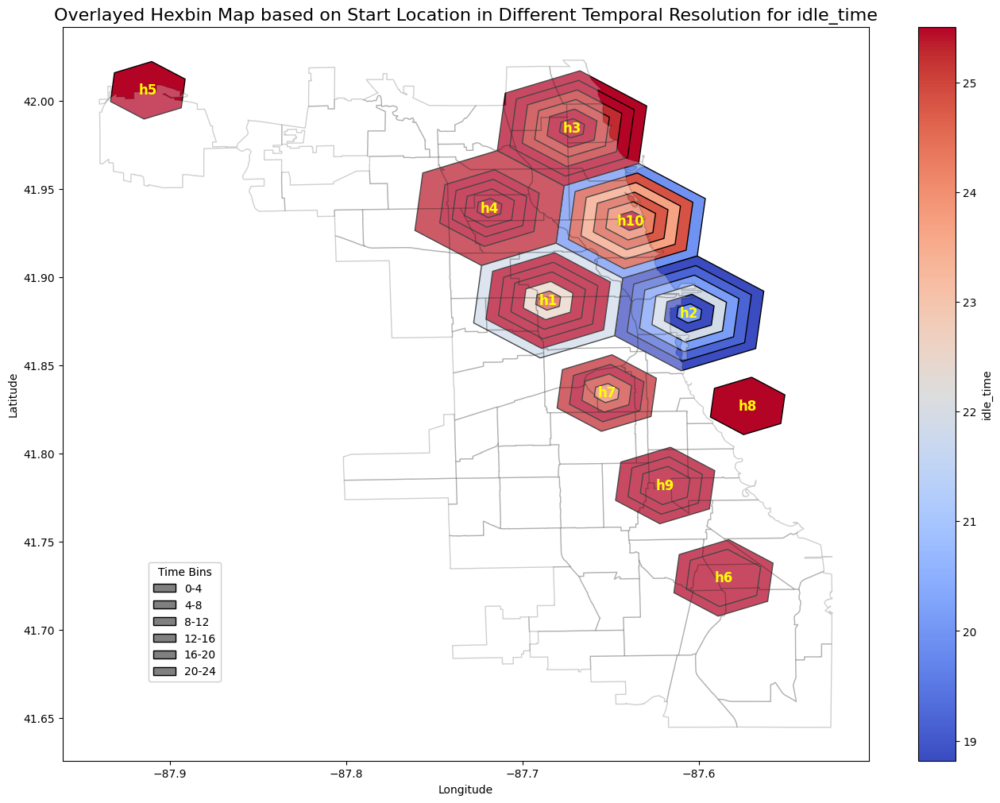

In [71]:
plot_chicago_hexbin(
    community_area_boundaries=community_area_boundaries,
    chicago_shape=chicago_shape,
    chloropleth_means_map=chloropleth_means_map,
    gdf_idle=gdf_idle,
    metric='idle_time',
    filters={},
    value_range=(0, 75),
    vmin=None,
    vmax=None,
    resolution='h3_res_6_end',
    time_bins=['0-4', '4-8', '8-12', '12-16', '16-20', '20-24'],
    hexbin_scales=[6/6, 5/6, 4/6, 3/6, 2/6, 1/6],
    min_trip_count= 5000,
    label_hexagons=True,
    time_column='4h_bucket'  # or 'quarter'
)

No major differences over the day can be overserved. For h3 and h7 there is a lower idle time from 0-4. There are no major patterns of idle time that can be derived from this graph.

## COVID-19 Assessment

In [72]:
# Define the COVID outbreak date
covid_outbreak_date = pd.to_datetime('2020-03-11')

# Create the 'is_covid' column
gdf_idle['is_covid'] = gdf_idle['datetime'] > covid_outbreak_date

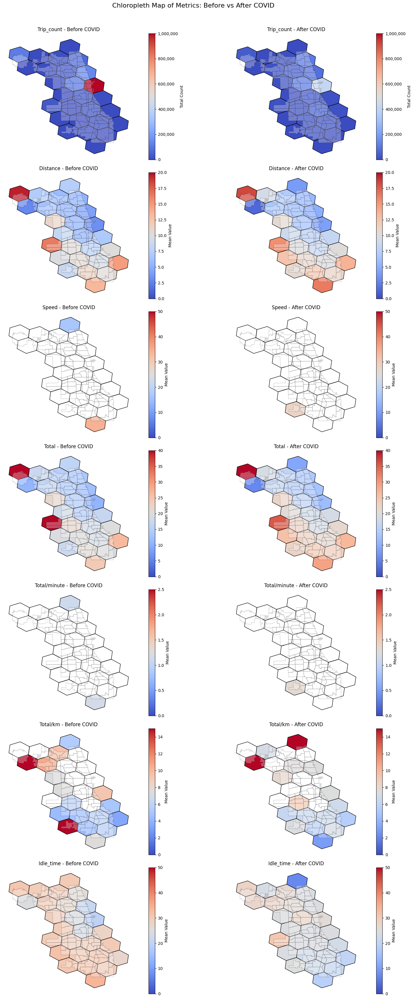

In [73]:
# Define metrics to calculate
metrics = ['trip_count', 'distance', 'speed', 'total', 'total/minute', 'total/km', 'idle_time']

# Define fixed maximum values for normalization
fixed_max_values = {
    'speed': 50,
    'total': 40,
    'total/minute': 2.5,
    'total/km': 15,
    'idle_time': 50,
    'trip_count': 1000000,
    'distance': 20
}

# Initialize the figure
nrows = len(metrics)
ncols = 2
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 10, nrows * 5))
axes = axes.flatten()

def chloropleth_means_map(gdf, resolution, metric):
    # Create a copy of the dataframe to avoid the SettingWithCopyWarning
    gdf_copy = gdf.copy()

    # Define new calculated metrics
    if metric == "speed":
        # Calculate speed in km/h
        gdf_copy.loc[:, 'calculated_metric'] = (gdf_copy['distance'] / gdf_copy['duration']) * 3600
    elif metric == "total/minute":
        # Calculate total per minute
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / (gdf_copy['duration'] / 60)
    elif metric == "total/km":
        # Calculate total per km
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy['total'] / gdf_copy['distance']
    elif metric == "trip_count":
        # Use 1 to count each trip
        gdf_copy.loc[:, 'calculated_metric'] = 1
    elif metric in ["distance", "total", "idle_time"]:
        # Use the given metric directly
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy[metric]
    else:
        # If the metric is not specified, just copy it
        gdf_copy.loc[:, 'calculated_metric'] = gdf_copy[metric]

    # Group by resolution
    if metric == "trip_count":
        chloro_mean = gdf_copy.groupby(resolution).agg(
            mean_metric=('calculated_metric', 'sum'),  # sum for trip count
            trip_count=('trip_id', 'count')
        ).reset_index()
    else:
        chloro_mean = gdf_copy.groupby(resolution).agg(
            mean_metric=('calculated_metric', 'mean'),  # mean for other metrics
            trip_count=('trip_id', 'count')
        ).reset_index()

    chloro_mean.columns = ['id', 'mean', 'trip_count']
    chloro_mean['geometry'] = chloro_mean.apply(
        lambda x: Polygon(h3.h3_to_geo_boundary(x["id"], geo_json=True)), axis=1)

    chloro_mean_geo = gpd.GeoDataFrame(chloro_mean, geometry='geometry', crs='EPSG:4326')
    return chloro_mean_geo

# Iterate over metrics
for metric_index, metric in enumerate(metrics):
    # Determine fixed min and max values
    global_vmin = 0
    global_vmax = fixed_max_values.get(metric, None)  # Use provided max or default if not specified

    # Skip metrics without defined max values
    if global_vmax is None:
        continue

    # Iterate over before and after COVID
    covid_categories = ['Before COVID', 'After COVID']
    for covid_index, covid_category in enumerate(covid_categories):
        ax_index = metric_index * 2 + covid_index
        ax = axes[ax_index]
        
        # Filter data based on COVID period
        is_covid = True if covid_category == 'After COVID' else False
        filtered_data = gdf_idle[gdf_idle['is_covid'] == is_covid]

        # Apply additional filtering for idle_time
        if metric == "idle_time":
            filtered_data = filtered_data[(filtered_data['idle_time'] >= 0) & (filtered_data['idle_time'] <= 75)]

        # Normalize colors based on the fixed min and max
        norm = mcolors.Normalize(vmin=global_vmin, vmax=global_vmax)
        cmap = plt.cm.coolwarm

        # Plot the chloropleth map
        chloro_data = chloropleth_means_map(filtered_data, 'h3_res_6_start', metric)
        if not chloro_data.empty:
            im = chloro_data.plot(
                ax=ax, column='mean', cmap=cmap, norm=norm, edgecolor='k', legend=False)
            
            plot_chicago_shape(ax)
            ax.set_title(f'{metric.capitalize()} - {covid_category}')
            ax.set_axis_off()

            # Create a colorbar for each subplot
            cbar = fig.colorbar(im.collections[0], ax=ax, orientation='vertical', norm=norm, cmap=cmap)
            cbar.set_label('Mean Value' if metric != 'trip_count' else 'Total Count')
            
            # Format y-axis for trip count
            if metric == "trip_count":
                cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
        else:
            ax.set_title(f'{metric.capitalize()} - {covid_category}\nNo Data Available')
            ax.set_axis_off()

fig.suptitle('Chloropleth Map of Metrics: Before vs After COVID', fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.subplots_adjust(top=0.95)
plt.show()

After COVID, central areas had the highest trip counts, exceeding 800,000. After COVID, these counts significantly dropped, indicating restricted travel. Average trip distances ere slightly longer after COVID, especially in outer regions.

Speeds increased slightly post-COVID due to less congestion. Idle times dropped slightly after COVID, particularly in areas with reduced trips, indicating shorter waits between rides, which is quite suprising, but could be due to less taxis deployed druing COVID.

Overall the patterns seem quite similar for all metrics except trip count and idle time.

# Conclusions

The analysis of the taxi data provides a comprehensive understanding of taxi operations in Chicago.

### Payment Trends

- **Card Payments:** There was a significant decline in card payments following the COVID-19 outbreak. Non-card payments (cash) typically do not register tips, indicating a potential shift in consumer behavior or reporting practices.

### Idle Time Patterns

- **Overall Idle Time:** Taxis experience significant idle times during non-peak hours. More than 75 minutes of idle time is often attributed to breaks or shift changes, which are not directly related to passenger demand.
- **Rush Hour Impact:** During rush hours (6-9 am and 4-6 pm), idle times are reduced, reflecting higher demand. However, the reduction is less pronounced than expected, possibly due to increased remote work during COVID-19.

### Spatial Distribution

- **Pickup and Dropoff Concentration:** Taxi pickups and dropoffs are heavily concentrated in specific areas, notably the Middle East of Chicago. This pattern indicates high demand in central business districts and densely populated areas.
- **Company Coverage:** Flash Cab and Taxi Affiliation Services dominate the market, with distinct regional coverage patterns. Flash Cab tends to dominate less trafficked areas, while Taxi Affiliation Services has a strong presence in central and northwest regions.

### H3 Choropleth Map Insights

- **Length, Duration, and Speed:** Average speeds are higher on the outskirts of Chicago, indicating less traffic congestion. Central areas exhibit lower speeds due to higher traffic volumes.
- **Fare Distribution:** The total fare is closely linked to trip length. Areas with longer average trips have higher total fares. Tips show spatial variability, with certain regions, especially in the Midnorth, displaying greater generosity.
- **Extras and Outliers:** Extras are generally low across most hexagons, except for a specific outlier in the northwest, suggesting isolated incidents of high extra charges.

### Temporal Analysis

- **Trip Count Variation:** Weekday traffic differs from weekend patterns in the central Chicago area. Weekdays see a high volume of work-related trips, while weekends are dominated by leisure travel.
- **Distance and Duration Patterns:** Longest distances are covered in the northwest during early hours, while the south shows higher distances late at night. The Mideast remains stable throughout the day.
- **Speed Dynamics:** Higher speeds are observed during late-night hours when traffic is lighter. The south of Chicago downtown experiences lower speeds during commuting hours, indicating congestion.
- **Fare per Minute and Kilometer:** The northwest shows the highest fares per kilometer, consistent throughout the day. This reflects localized demand and possibly longer trip lengths in those areas.

### COVID-19 Impact

- **Trip Counts:** Massive Impact. After the outbreak the trip count were massively reduced.
- **Trip Distances:** Average trip distances increased slightly after COVID, particularly in outer regions, suggesting longer trips but fewer in number.
- **Speeds and Idle Times:** Speeds increased slightly due to reduced congestion. Idle times dropped, especially in areas with fewer trips, suggesting fewer taxis were in operation during the pandemic.